# Data Visualization Project

## Dataset: Student Enrollment in General and Technological High Schools

*(https://www.data.gouv.fr/fr/datasets/effectifs-deleves-par-niveau-sexe-langues-vivantes-1-et-2-les-plus-frequentes-par-lycee-denseignement-general-et-technologique-date-dobservation-au-debut-du-mois-doctobre-chaque-annee/)*

-------------------
## Importing Libraries

In [47]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import json
import seaborn as sns

## First Approaches

In [48]:
file_path = 'fr-en-lycee_gt-effectifs-niveau-sexe-lv (2).csv'
data = pd.read_csv(file_path, sep=';', on_bad_lines='skip')

data.head()

C:\Users\Alicia LE BRUN\AppData\Local\Temp\ipykernel_32560\3046659268.py:2: DtypeWarning:

Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.



,num_ligne,rentree_scolaire,code_region_academique,region_academique,code_academie_et_assimile,academie,code_departement_pays,departement,code_postal,commune,...,terminales_std2a_lv1_espagnol,terminales_std2a_lv1_autres_langues,terminales_std2a_lv2_allemand,terminales_std2a_lv2_anglais,terminales_std2a_lv2_espagnol,terminales_std2a_lv2_italien,terminales_std2a_lv2_autres_langues,terminales_sthr,terminales_tmd,terminales_bt
0,1,2020,1,AUVERGNE-RHONE-ALPES,6,CLERMONT-FERRAND,003,ALLIER,3000,MOULINS,...,0,0,0,0,0,0,0,0,0,0
1,2,2020,1,AUVERGNE-RHONE-ALPES,6,CLERMONT-FERRAND,003,ALLIER,3008,MOULINS,...,0,0,0,0,0,0,0,0,0,0
2,3,2020,1,AUVERGNE-RHONE-ALPES,6,CLERMONT-FERRAND,003,ALLIER,3017,MOULINS,...,0,0,0,0,0,0,0,0,0,0
3,4,2020,1,AUVERGNE-RHONE-ALPES,6,CLERMONT-FERRAND,003,ALLIER,3100,MONTLUCON,...,0,0,0,0,0,0,0,0,0,0
4,5,2020,1,AUVERGNE-RHONE-ALPES,6,CLERMONT-FERRAND,003,ALLIER,3103,MONTLUCON,...,0,0,0,0,0,0,0,0,0,0


In [49]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10093 entries, 0 to 10092
Columns: 180 entries, num_ligne to terminales_bt
dtypes: float64(1), int64(170), object(9)
memory usage: 13.9+ MB


In [50]:
data.describe()

,num_ligne,rentree_scolaire,code_region_academique,code_academie_et_assimile,code_postal,nombre_d_eleves,2ndes_gt,2ndes_gt_filles,2ndes_gt_garcons,2ndes_gt_lv1_allemand,...,terminales_std2a_lv1_espagnol,terminales_std2a_lv1_autres_langues,terminales_std2a_lv2_allemand,terminales_std2a_lv2_anglais,terminales_std2a_lv2_espagnol,terminales_std2a_lv2_italien,terminales_std2a_lv2_autres_langues,terminales_sthr,terminales_tmd,terminales_bt
count,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,...,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000,10093.000000
mean,5047.000000,2021.498960,9.597642,17.577529,57126.778262,645.434559,224.303973,120.790746,103.513227,4.075300,...,0.003864,0.000396,0.277915,0.012979,1.081938,0.092936,0.022491,0.893193,0.144060,0.087486
std,2913.742467,1.118488,5.566581,15.046679,27909.925012,412.496398,145.367475,81.171609,68.625459,15.658327,...,0.115594,0.024380,1.874782,0.263986,5.516534,0.913241,0.321925,5.883454,1.593889,1.130407
min,1.000000,2020.000000,0.000000,1.000000,1000.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2524.000000,2020.000000,5.000000,9.000000,34000.000000,300.000000,106.000000,55.000000,50.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5047.000000,2021.000000,10.000000,15.000000,60321.000000,604.000000,213.000000,114.000000,98.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7570.000000,2022.000000,15.000000,24.000000,78131.000000,951.000000,330.000000,178.000000,151.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,10093.000000,2023.000000,18.000000,70.000000,98890.000000,2599.000000,927.000000,514.000000,416.000000,357.000000,...,6.000000,2.000000,50.000000,10.000000,68.000000,27.000000,12.000000,97.000000,32.000000,36.000000


In [51]:
columns = data.columns
columns

Index(['num_ligne', 'rentree_scolaire', 'code_region_academique',
       'region_academique', 'code_academie_et_assimile', 'academie',
       'code_departement_pays', 'departement', 'code_postal', 'commune',
       ...
       'terminales_std2a_lv1_espagnol', 'terminales_std2a_lv1_autres_langues',
       'terminales_std2a_lv2_allemand', 'terminales_std2a_lv2_anglais',
       'terminales_std2a_lv2_espagnol', 'terminales_std2a_lv2_italien',
       'terminales_std2a_lv2_autres_langues', 'terminales_sthr',
       'terminales_tmd', 'terminales_bt'],
      dtype='object', length=180)

## Gender

**1) Gender Proportions in the Dataset:**

In [52]:
# Filter and display the names of columns that contain the words "fille" or "garcon"
columns_with_fille = [col for col in columns if "fille" in col.lower()]
columns_with_garcon = [col for col in columns if "garcon" in col.lower()]

columns_with_fille, columns_with_garcon

(['2ndes_gt_filles',
  '1eres_g_filles',
  '1eres_sti2d_filles',
  '1eres_stl_filles',
  '1eres_stmg_filles',
  '1eres_st2s_filles',
  '1eres_std2a_filles',
  'terminales_g_filles',
  'terminales_sti2d_filles',
  'terminales_stl_filles',
  'terminales_stmg_filles',
  'terminales_st2s_filles',
  'terminales_std2a_filles'],
 ['2ndes_gt_garcons',
  '1eres_g_garcons',
  '1eres_sti2d_garcons',
  '1eres_stl_garcons',
  '1eres_stmg_garcons',
  '1eres_st2s_garcons',
  '1eres_std2a_garcons',
  'terminales_g_garcons',
  'terminales_sti2d_garcons',
  'terminales_stl_garcons',
  'terminales_stmg_garcons',
  'terminales_st2s_garcons',
  'terminales_std2a_garcons'])

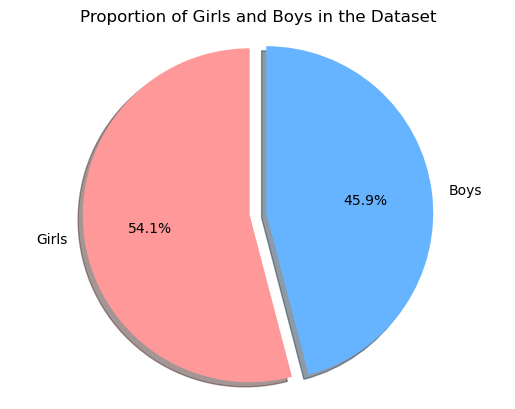

In [53]:
# Calculate the total for girls and boys
total_filles = data[columns_with_fille].sum().sum()
total_garcons = data[columns_with_garcon].sum().sum()

# Calculate the proportion
total_eleves = total_filles + total_garcons
proportion_filles = (total_filles / total_eleves) * 100
proportion_garcons = (total_garcons / total_eleves) * 100

labels = ['Girls', 'Boys']
sizes = [proportion_filles, proportion_garcons]
colors = ['#ff9999','#66b3ff']
explode = (0.1, 0)  # explode to highlight the girls

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.title("Proportion of Girls and Boys in the Dataset")
plt.show()

Despite a slight predominance of girls in the dataset's student population, the gender distribution is relatively balanced, allowing us to continue our analysis without concern for any significant imbalance.

**2) Gender Proportions by Level:**

In [54]:
niveaux_principaux = {
    "2nde": ["2ndes_gt"],
    "1ère": ["1eres_g", "1eres_sti2d", "1eres_stl", "1eres_stmg", "1eres_st2s", "1eres_std2a"],
    "Terminale": ["terminales_g", "terminales_sti2d", "terminales_stl", "terminales_stmg", "terminales_st2s", "terminales_std2a"]
}

totals_by_main_level = {
    "Niveau": [],
    "Total Filles": [],
    "Total Garçons": []
}

# Assuming data is loaded into a DataFrame 'data'
# (You need to load your data here)

# Calculate totals and proportions for each main level
for niveau, sub_niveaux in niveaux_principaux.items():
    total_filles = sum(data[f"{sub}_filles"].sum() for sub in sub_niveaux)
    total_garcons = sum(data[f"{sub}_garcons"].sum() for sub in sub_niveaux)
    totals_by_main_level["Niveau"].append(niveau)
    totals_by_main_level["Total Filles"].append(total_filles)
    totals_by_main_level["Total Garçons"].append(total_garcons)

df_totals_by_main_level = pd.DataFrame(totals_by_main_level)
df_totals_by_main_level['Total'] = df_totals_by_main_level['Total Filles'] + df_totals_by_main_level['Total Garçons']
df_totals_by_main_level['Proportion Filles (%)'] = (df_totals_by_main_level['Total Filles'] / df_totals_by_main_level['Total']) * 100
df_totals_by_main_level['Proportion Garçons (%)'] = (df_totals_by_main_level['Total Garçons'] / df_totals_by_main_level['Total']) * 100

# Check if the column exists
print(df_totals_by_main_level.columns)


Index(['Niveau', 'Total Filles', 'Total Garçons', 'Total',
       'Proportion Filles (%)', 'Proportion Garçons (%)'],
      dtype='object')


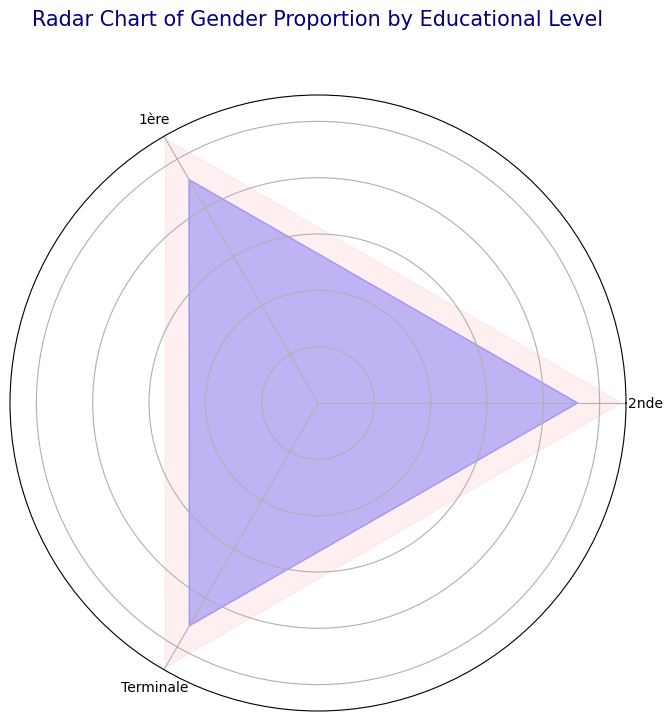

In [55]:
# Convertir les proportions en valeurs utilisables pour le radar chart
labels = np.array(df_totals_by_main_level['Niveau'])
stats_filles = df_totals_by_main_level['Proportion Filles (%)'].values / 100 * 5  # Normaliser sur une échelle de 1 à 5 pour la visualisation
stats_garcons = df_totals_by_main_level['Proportion Garçons (%)'].values / 100 * 5

# Créer les angles pour le radar chart
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
stats_filles = np.concatenate((stats_filles,[stats_filles[0]]))
stats_garcons = np.concatenate((stats_garcons,[stats_garcons[0]]))
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.fill(angles, stats_filles, color='pink', alpha=0.25)
ax.fill(angles, stats_garcons, color='blue', alpha=0.25)
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
plt.title('Radar Chart of Gender Proportion by Educational Level', size=15, color='navy', y=1.1)

plt.show()

The proportions between girls and boys are relatively consistent across educational levels, which is represented by the almost symmetrical areas between the levels.
Proportion of girls (in pale pink) and proportion of boys (in blue): We observe a balanced trend between genders, but the chart shows that the proportion of girls remains slightly higher at all levels (explained by the slight initial imbalance in the dataset – everything makes sense)

**3) Gender Proportions by Track:**

C:\Users\Alicia LE BRUN\AppData\Local\Temp\ipykernel_32560\2455517403.py:30: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



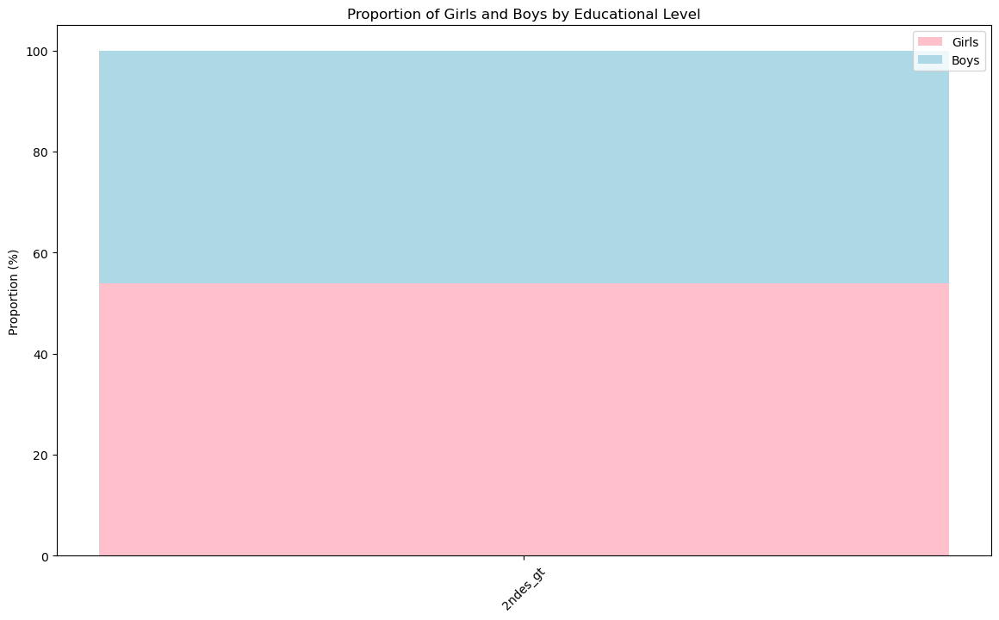

In [56]:
niveaux = ['2ndes_gt']

# Calculer le total des filles et des garçons par niveau
totals_per_level = {
    "Niveau": [],
    "Total Filles": [],
    "Total Garçons": []
}

for niveau in niveaux:
    fille_column = f'{niveau}_filles'
    garcon_column = f'{niveau}_garcons'
    totals_per_level["Niveau"].append(niveau)
    totals_per_level["Total Filles"].append(data[fille_column].sum())
    totals_per_level["Total Garçons"].append(data[garcon_column].sum())

df_totals_per_level = pd.DataFrame(totals_per_level)

# Calculer la proportion de filles et de garçons par niveau
df_totals_per_level['Total'] = df_totals_per_level['Total Filles'] + df_totals_per_level['Total Garçons']
df_totals_per_level['Proportion Filles (%)'] = (df_totals_per_level['Total Filles'] / df_totals_per_level['Total']) * 100
df_totals_per_level['Proportion Garçons (%)'] = (df_totals_per_level['Total Garçons'] / df_totals_per_level['Total']) * 100

# Tracer le graphique des proportions par niveau
fig, ax = plt.subplots(figsize=(14, 8))
ax.bar(df_totals_per_level['Niveau'], df_totals_per_level['Proportion Filles (%)'], label='Girls', color='pink')
ax.bar(df_totals_per_level['Niveau'], df_totals_per_level['Proportion Garçons (%)'], bottom=df_totals_per_level['Proportion Filles (%)'], label='Boys', color='lightblue')
ax.set_ylabel('Proportion (%)')
ax.set_title('Proportion of Girls and Boys by Educational Level')
ax.set_xticklabels(df_totals_per_level['Niveau'], rotation=45)
ax.legend()

plt.show()

This chart shows a fairly balanced distribution between girls and boys in general and technological second-year high school classes. The proportion of girls is slightly higher than that of boys, as observed in other levels as well.

C:\Users\Alicia LE BRUN\AppData\Local\Temp\ipykernel_32560\601264016.py:30: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



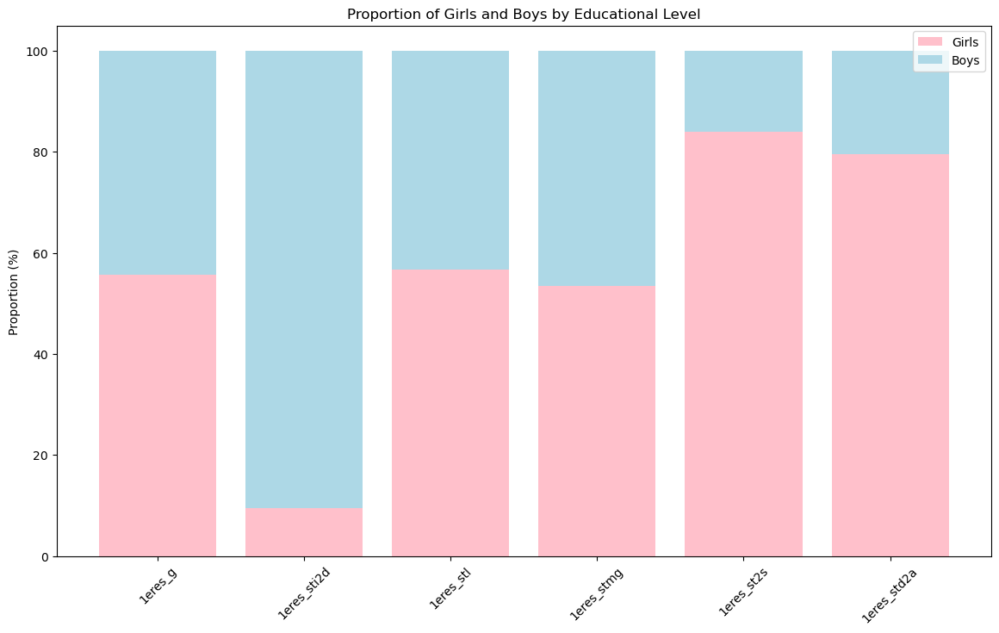

In [57]:
niveaux = ['1eres_g', '1eres_sti2d', '1eres_stl', '1eres_stmg', '1eres_st2s', '1eres_std2a']

# Calculer le total des filles et des garçons par niveau
totals_per_level = {
    "Niveau": [],
    "Total Filles": [],
    "Total Garçons": []
}

for niveau in niveaux:
    fille_column = f'{niveau}_filles'
    garcon_column = f'{niveau}_garcons'
    totals_per_level["Niveau"].append(niveau)
    totals_per_level["Total Filles"].append(data[fille_column].sum())
    totals_per_level["Total Garçons"].append(data[garcon_column].sum())

df_totals_per_level = pd.DataFrame(totals_per_level)

# Calculer la proportion de filles et de garçons par niveau
df_totals_per_level['Total'] = df_totals_per_level['Total Filles'] + df_totals_per_level['Total Garçons']
df_totals_per_level['Proportion Filles (%)'] = (df_totals_per_level['Total Filles'] / df_totals_per_level['Total']) * 100
df_totals_per_level['Proportion Garçons (%)'] = (df_totals_per_level['Total Garçons'] / df_totals_per_level['Total']) * 100

# Tracer le graphique des proportions par niveau
fig, ax = plt.subplots(figsize=(14, 8))
ax.bar(df_totals_per_level['Niveau'], df_totals_per_level['Proportion Filles (%)'], label='Girls', color='pink')
ax.bar(df_totals_per_level['Niveau'], df_totals_per_level['Proportion Garçons (%)'], bottom=df_totals_per_level['Proportion Filles (%)'], label='Boys', color='lightblue')
ax.set_ylabel('Proportion (%)')
ax.set_title('Proportion of Girls and Boys by Educational Level')
ax.set_xticklabels(df_totals_per_level['Niveau'], rotation=45)
ax.legend()

plt.show()

This chart shows differences in distribution according to the first-year tracks: 
* 1ère G (general): Balanced proportions between girls and boys.
* 1ère STI2D: A significant majority of boys.
* 1ère STL, STMG, ST2S, STD2A: Majority of girls, particularly in ST2S and STD2A

C:\Users\Alicia LE BRUN\AppData\Local\Temp\ipykernel_32560\1142486480.py:30: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



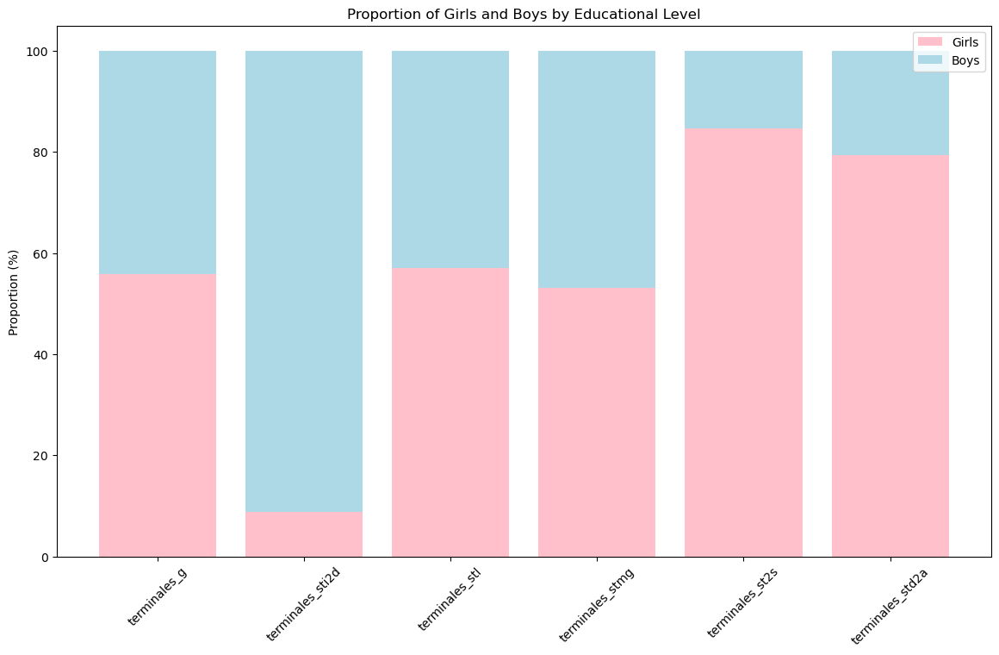

In [58]:
niveaux = ['terminales_g', 'terminales_sti2d', 'terminales_stl', 'terminales_stmg', 'terminales_st2s', 'terminales_std2a']

# Calculer le total des filles et des garçons par niveau
totals_per_level = {
    "Niveau": [],
    "Total Filles": [],
    "Total Garçons": []
}

for niveau in niveaux:
    fille_column = f'{niveau}_filles'
    garcon_column = f'{niveau}_garcons'
    totals_per_level["Niveau"].append(niveau)
    totals_per_level["Total Filles"].append(data[fille_column].sum())
    totals_per_level["Total Garçons"].append(data[garcon_column].sum())

df_totals_per_level = pd.DataFrame(totals_per_level)

# Calculer la proportion de filles et de garçons par niveau
df_totals_per_level['Total'] = df_totals_per_level['Total Filles'] + df_totals_per_level['Total Garçons']
df_totals_per_level['Proportion Filles (%)'] = (df_totals_per_level['Total Filles'] / df_totals_per_level['Total']) * 100
df_totals_per_level['Proportion Garçons (%)'] = (df_totals_per_level['Total Garçons'] / df_totals_per_level['Total']) * 100

# Tracer le graphique des proportions par niveau
fig, ax = plt.subplots(figsize=(14, 8))
ax.bar(df_totals_per_level['Niveau'], df_totals_per_level['Proportion Filles (%)'], label='Girls', color='pink')
ax.bar(df_totals_per_level['Niveau'], df_totals_per_level['Proportion Garçons (%)'], bottom=df_totals_per_level['Proportion Filles (%)'], label='Boys', color='lightblue')
ax.set_ylabel('Proportion (%)')
ax.set_title('Proportion of Girls and Boys by Educational Level')
ax.set_xticklabels(df_totals_per_level['Niveau'], rotation=45)
ax.legend()

plt.show()

The trends observed in the first year are confirmed in the final year: 
* Terminale STI2D: Strong predominance of boys.
* Terminale STL and STMG: More balanced distribution.
* Terminale ST2S and STD2A: Strong majority of girls.

***Overall analysis:*** These charts reveal a gender distribution that varies significantly depending on the track, with a male predominance in technological tracks (STI2D) and a strong female representation in tracks related to health and social care (ST2S, STD2A). These results highlight gender-differentiated choices made by students based on the specifics of the tracks. This can be explained by several factors. The differences in the distribution of boys and girls in social, health, and technological tracks are largely influenced by sociocultural, historical, and psychological factors. Historically, careers related to care, education, and social work, such as those targeted by the ST2S (health and social sciences and technologies) and STD2A (design and applied arts sciences and technologies) tracks, are often perceived as requiring qualities such as empathy, listening skills, and the ability to care for others—competencies traditionally associated with women. This association with gender roles may lead girls to be encouraged from a young age to pursue these careers. On the other hand, technological tracks like STI2D (industrial sciences and technologies and sustainable development) are often perceived as more technical, requiring skills in science, mathematics, and engineering—fields historically dominated by men. Boys, often socialized around practical or technical activities, may be encouraged to choose these tracks where innovation, construction, and cutting-edge technologies are central to the learning process. Gender stereotypes, often reinforced by teachers, career counselors, and even parents, play a significant role in these orientations. As a result, young girls may be more directed towards "traditional" careers in care or education, while boys are steered towards technological or industrial careers. This phenomenon reflects the persistence of gender roles in society, although progress in gender equality has led to advancements in the diversity of career paths for both sexes.

## Sector

**1) Proportion of Students by Sector:**

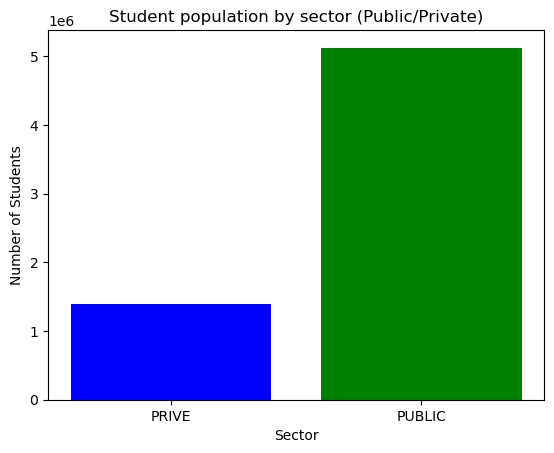

,secteur,nombre_d_eleves
0,PRIVE,1393074
1,PUBLIC,5121297


In [59]:
# Group the data by 'secteur' and sum the 'nombre_d_eleves' to get the total number of students in each sector
sector_population = data.groupby('secteur')['nombre_d_eleves'].sum().reset_index()

# Visualize the student population distribution by sector
fig, ax = plt.subplots()
ax.bar(sector_population['secteur'], sector_population['nombre_d_eleves'], color=['blue', 'green'])
ax.set_xlabel('Sector')
ax.set_ylabel('Number of Students')
ax.set_title('Student population by sector (Public/Private)')
plt.show()

sector_population


This chart highlights the overwhelming dominance of the public sector in student enrollment in France, with roughly four times more students than in the private sector. This significant difference can be explained by several factors:

* Free access: Public education in France is free, making it accessible to the majority of students, whereas private education is often paid.

* Cultural and social preferences: Some parents choose private education for pedagogical, religious, or school reputation reasons, but this represents a minority compared to enrollments in public schools.

**2) Gender Proportions by Sector:**

In [60]:
# Identify the columns for girls and boys in the dataset again, if they are not already known
columns_with_fille = [col for col in data.columns if "fille" in col.lower()]
columns_with_garcon = [col for col in data.columns if "garcon" in col.lower()]

# Calculate the total number of girls and boys in each sector
data['Total Filles'] = data[columns_with_fille].sum(axis=1)
data['Total Garçons'] = data[columns_with_garcon].sum(axis=1)

# Group by 'secteur' and sum up these totals to get gender proportions by sector
gender_by_sector = data.groupby('secteur')[['Total Filles', 'Total Garçons']].sum().reset_index()

# Calculate proportions
gender_by_sector['Proportion Filles (%)'] = (gender_by_sector['Total Filles'] / 
                                             (gender_by_sector['Total Filles'] + gender_by_sector['Total Garçons'])) * 100
gender_by_sector['Proportion Garçons (%)'] = (gender_by_sector['Total Garçons'] / 
                                              (gender_by_sector['Total Filles'] + gender_by_sector['Total Garçons'])) * 100

# Display the results
gender_by_sector

,secteur,Total Filles,Total Garçons,Proportion Filles (%),Proportion Garçons (%)
0,PRIVE,742493,646655,53.449524,46.550476
1,PUBLIC,2763073,2330529,54.245954,45.754046


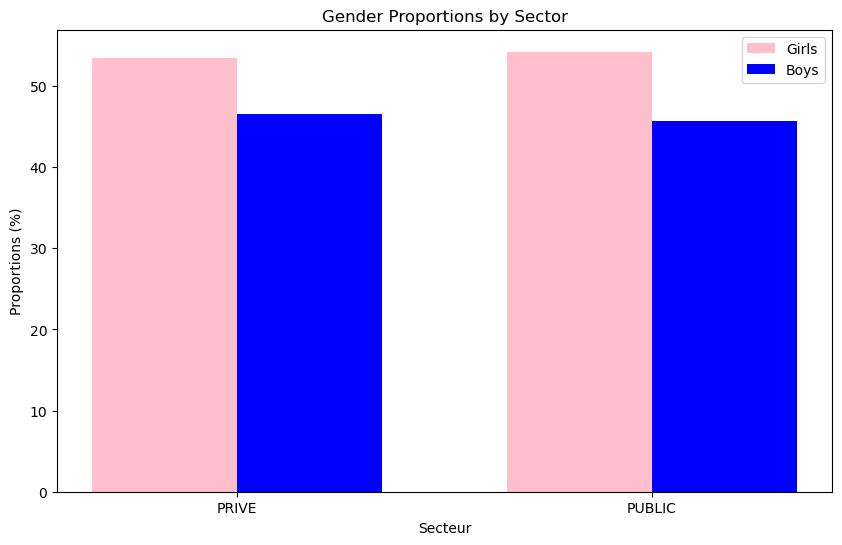

In [61]:
# Visualize the gender proportions for each sector
fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.35
index = np.arange(len(gender_by_sector['secteur']))

bars1 = ax.bar(index, gender_by_sector['Proportion Filles (%)'], bar_width, label='Girls', color='pink')
bars2 = ax.bar(index + bar_width, gender_by_sector['Proportion Garçons (%)'], bar_width, label='Boys', color='blue')

ax.set_xlabel('Secteur')
ax.set_ylabel('Proportions (%)')
ax.set_title('Gender Proportions by Sector')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(gender_by_sector['secteur'])
ax.legend()

plt.show()

This disparity aligns perfectly with the slight initial imbalance. This means that there are approximately as many girls as boys in both private and public sectors. Everything is balanced.

## Areas

**1) Number of Students:**

In [62]:
# Print a sample of department names to check their format
print(data['departement'].unique())


['ALLIER' 'CANTAL' 'HAUTE-LOIRE' 'PUY-DE-DOME' 'ARDECHE' 'DROME'
 'HAUTE SAVOIE' 'ISERE' 'SAVOIE' 'AIN' 'LOIRE' 'RHONE' 'DOUBS'
 'HAUTE-SAONE' 'JURA' 'TERRITOIRE DE BELFORT' "COTE D'OR" 'NIEVRE'
 'SAONE-ET-LOIRE' 'YONNE' "COTES D'ARMOR" 'FINISTERE' 'ILLE-ET-VILAINE'
 'MORBIHAN' 'CHER' 'EURE-ET-LOIR' 'INDRE' 'INDRE-ET-LOIRE' 'LOIRET'
 'LOIR-ET-CHER' 'CORSE-DU-SUD' 'HAUTE-CORSE' 'MEURTHE-ET-MOSELLE' 'MEUSE'
 'MOSELLE' 'VOSGES' 'ARDENNES' 'AUBE' 'HAUTE-MARNE' 'MARNE' 'BAS-RHIN'
 'HAUT-RHIN' 'GUADELOUPE' 'GUYANE' 'AISNE' 'OISE' 'SOMME' 'NORD'
 'PAS-DE-CALAIS' 'SEINE-ET-MARNE' 'SEINE-SAINT-DENIS' 'VAL-DE-MARNE'
 'PARIS' 'ESSONNE' 'HAUTS-DE-SEINE' "VAL-D'OISE" 'YVELINES' 'LA REUNION'
 'MARTINIQUE' 'MAYOTTE' 'CALVADOS' 'MANCHE' 'ORNE' 'EURE' 'SEINE MARITIME'
 'DORDOGNE' 'GIRONDE' 'LANDES' 'LOT-ET-GARONNE' 'PYRENEES-ATLANTIQUES'
 'CORREZE' 'CREUSE' 'HAUTE-VIENNE' 'CHARENTE' 'CHARENTE-MARITIME'
 'DEUX-SEVRES' 'VIENNE' 'AUDE' 'GARD' 'HERAULT' 'LOZERE'
 'PYRENEES-ORIENTALES' 'ARIEGE' 'AVEYRON' 'G

In [63]:
urban_departments_names = [
    'PARIS', 'RHONE', 'BOUCHES-DU-RHONE', 'NORD', 'HAUTS-DE-SEINE', 
    'GIRONDE', 'LOIRE-ATLANTIQUE', 'SEINE-SAINT-DENIS', 'VAL-DE-MARNE', 
    'SEINE-ET-MARNE', 'ALPES-MARITIMES', 'HAUTE-GARONNE'
]

In [64]:
# Apply the classification using the department names
data['Area Classification'] = data['departement'].apply(lambda x: 'Urban' if x in urban_departments_names else 'Rural')

# Now check the results again
print(data['Area Classification'].unique())
print(data[['departement', 'Area Classification']].head())


['Rural' 'Urban']
  departement Area Classification
0      ALLIER               Rural
1      ALLIER               Rural
2      ALLIER               Rural
3      ALLIER               Rural
4      ALLIER               Rural


In [65]:
# Group by 'Area Classification' (Urban/Rural) and sum the student numbers
enrollment_by_area_sector = data.groupby('Area Classification')['nombre_d_eleves'].sum()

# Now we have the total number of students in Urban and Rural areas
print(enrollment_by_area_sector)

Area Classification
Rural    4418266
Urban    2096105
Name: nombre_d_eleves, dtype: int64


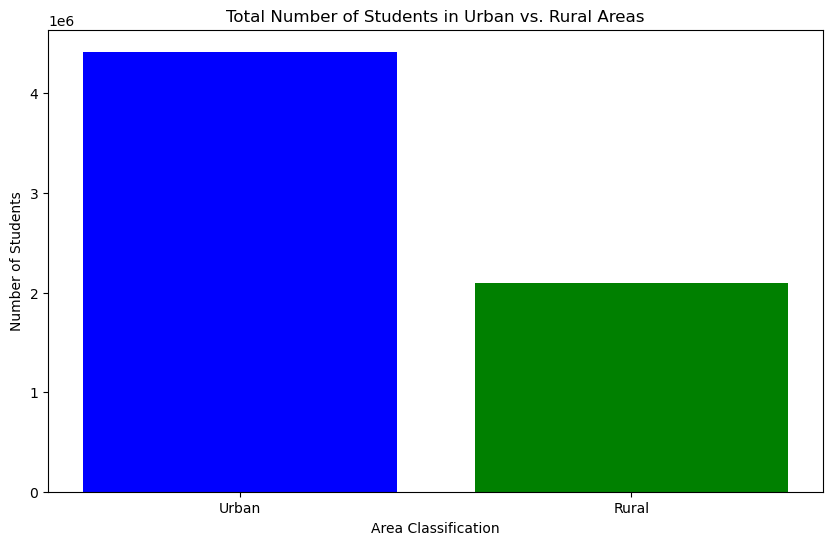

In [66]:
# Create a bar chart for the total number of students in Urban vs. Rural areas
categories = ['Urban', 'Rural']
totals = enrollment_by_area_sector.values

# Set up the bar chart
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(categories, totals, color=['blue', 'green'])

# Add labels and title
ax.set_xlabel('Area Classification')
ax.set_ylabel('Number of Students')
ax.set_title('Total Number of Students in Urban vs. Rural Areas')

# Show the plot
plt.show()

Students in urban areas are far more numerous, with over 4 million students, representing the majority. In contrast, around 2 million students are enrolled in rural areas, which is a significantly smaller student population. 
This significant difference between urban and rural areas can be explained by several factors:

* Population density: Urban areas are much more densely populated, leading to a higher concentration of students in these areas. In rural areas, the population is more dispersed, so schools there accommodate fewer students.
* Availability of infrastructure: Large cities have greater capacity in terms of school infrastructure, allowing them to accommodate a much larger number of students. In rural areas, schools are often fewer and sometimes located farther from students' homes.
* Urban area attractiveness: Cities attract more families due to the presence of jobs, services, and more diverse infrastructure, contributing to this unequal distribution

**2) Public or Private? :**

In [67]:
# Group by 'Area Classification' and 'secteur' (public/private) to get total student numbers by area and sector
enrollment_by_area_sector = data.groupby(['Area Classification', 'secteur'])['nombre_d_eleves'].sum().unstack()

# Calculate the total number of students in Urban and Rural areas
total_students_by_area = enrollment_by_area_sector.sum(axis=1)

In [68]:
# Calculate the proportions of students in public and private sectors relative to the total for each area
proportions_by_area_sector = enrollment_by_area_sector.div(total_students_by_area, axis=0) * 100

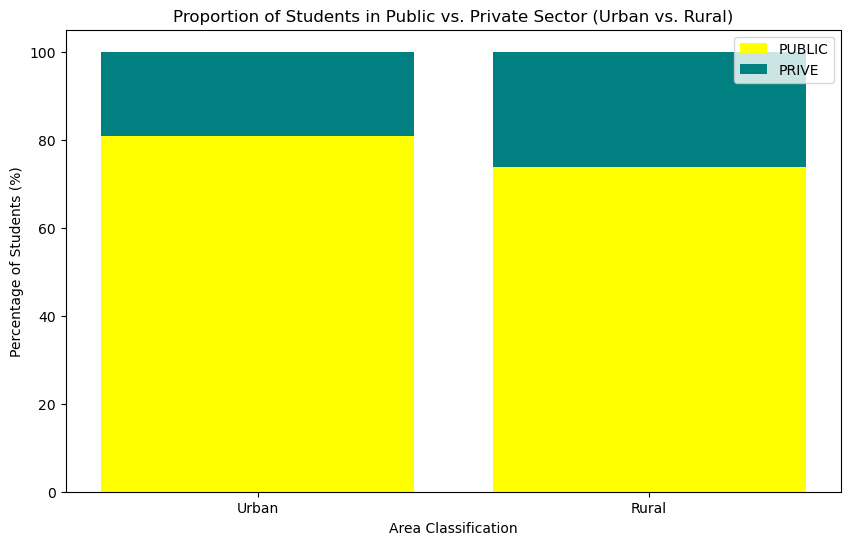

In [69]:
# Now plot the proportions of students in public and private sectors for Urban and Rural areas
categories = ['Urban', 'Rural']
public = proportions_by_area_sector['PUBLIC'].values
private = proportions_by_area_sector['PRIVE'].values

# Set up the stacked bar chart
fig, ax = plt.subplots(figsize=(10, 6))

bars1 = ax.bar(categories, public, label='PUBLIC', color='yellow')
bars2 = ax.bar(categories, private, bottom=public, label='PRIVE', color='teal')

# Add labels and title
ax.set_xlabel('Area Classification')
ax.set_ylabel('Percentage of Students (%)')
ax.set_title('Proportion of Students in Public vs. Private Sector (Urban vs. Rural)')
ax.legend()

# Show the plot
plt.show()

* Urban areas: Around 80% of students are enrolled in public schools, while about 20% attend private institutions. This indicates that even in urban areas, where there may be more private school options, the majority of students are enrolled in the public sector.
  
* Rural areas: The distribution is quite similar, with a slight increase in the percentage of students enrolled in private schools compared to urban areas, but the public sector remains dominant with around 80%.

This chart shows that, despite some slight differences between urban and rural areas, the majority of students, whether in cities or the countryside, are enrolled in public schools. This highlights a consistent access to public education, even in geographically and demographically different environments

## Regions

**1) LV1 by Region:**

In [70]:
columns[columns.str.contains('lv1', case=False, na=False)]

Index(['2ndes_gt_lv1_allemand', '2ndes_gt_lv1_anglais',
       '2ndes_gt_lv1_espagnol', '2ndes_gt_lv1_autres_langues',
       '1eres_g_lv1_allemand', '1eres_g_lv1_anglais', '1eres_g_lv1_espagnol',
       '1eres_g_lv1_autres_langues', '1eres_sti2d_lv1_allemand',
       '1eres_sti2d_lv1_anglais', '1eres_sti2d_lv1_espagnol',
       '1eres_sti2d_lv1_autres_langues', '1eres_stl_lv1_allemand',
       '1eres_stl_lv1_anglais', '1eres_stl_lv1_espagnol',
       '1eres_stl_lv1_autres_langues', '1eres_stmg_lv1_allemand',
       '1eres_stmg_lv1_anglais', '1eres_stmg_lv1_espagnol',
       '1eres_stmg_lv1_autres_langues', '1eres_st2s_lv1_allemand',
       '1eres_st2s_lv1_anglais', '1eres_st2s_lv1_espagnol',
       '1eres_st2s_lv1_autres_langues', '1eres_std2a_lv1_allemand',
       '1eres_std2a_lv1_anglais', '1eres_std2a_lv1_espagnol',
       '1eres_std2a_lv1_autres_langues', 'terminales_g_lv1_allemand',
       'terminales_g_lv1_anglais', 'terminales_g_lv1_espagnol',
       'terminales_g_lv1_autres_la

In [71]:
# Recheck the aggregation logic
# It seems like there's an issue with summing over multiple axes, so let's explicitly sum across the necessary levels for each language
lv1_columns = columns[columns.str.contains('lv1', case=False, na=False)].tolist()

languages_aggregated = {
    'lv1_anglais': [col for col in lv1_columns if 'anglais' in col],
    'lv1_espagnol': [col for col in lv1_columns if 'espagnol' in col],
    'lv1_allemand': [col for col in lv1_columns if 'allemand' in col],
    'lv1_autres_langues': [col for col in lv1_columns if 'autres_langues' in col]
}

aggregated_data = pd.DataFrame()
aggregated_data['region_academique'] = data['region_academique'].unique()

# Sum the counts for each language across all the levels (columns) and regions
for language, columns in languages_aggregated.items():
    aggregated_data[language] = data.groupby('region_academique')[columns].sum().sum(axis=1).values

# Check the content of aggregated_data to ensure the sums are correct
aggregated_data.head()

,region_academique,lv1_anglais,lv1_espagnol,lv1_allemand,lv1_autres_langues
0,AUVERGNE-RHONE-ALPES,751172,8352,4161,6967
1,BOURGOGNE-FRANCHE-COMTE,227498,2785,3399,461
2,BRETAGNE,313859,2622,2206,496
3,CENTRE-VAL DE LOIRE,223743,3519,945,347
4,CORSE,25971,155,9,199


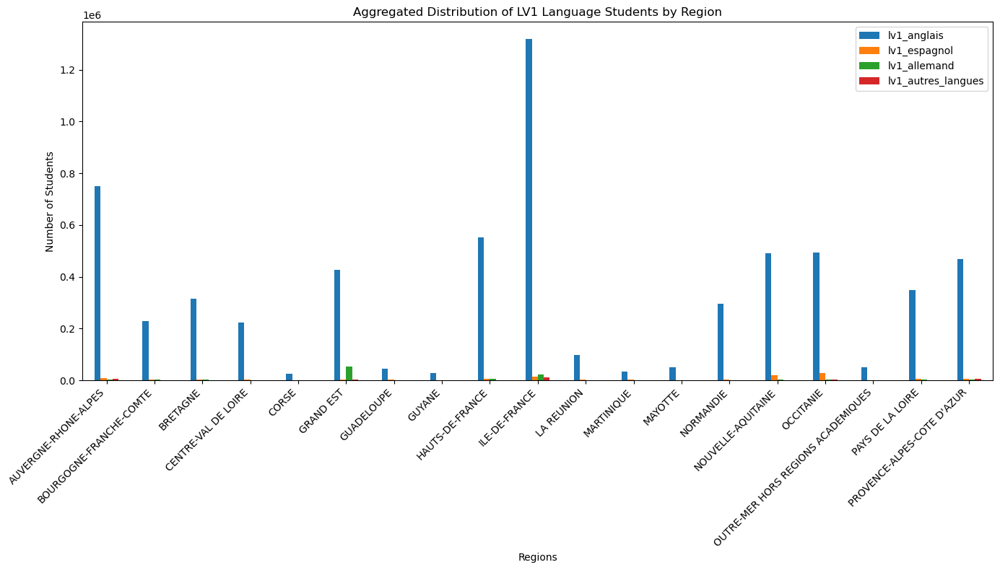

In [72]:
# Now that the data looks correctly aggregated, let's proceed with the plot

aggregated_data.set_index('region_academique').plot(kind='bar', figsize=(14, 8))
plt.title("Aggregated Distribution of LV1 Language Students by Region")
plt.xlabel("Regions")
plt.ylabel("Number of Students")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The chart highlights the dominance of English as the first foreign language (LV1) taught across France. This reflects the importance of English as an international language and the linguistic preferences in the French school system. However, this clear dominance overshadows the statistics of other languages. Therefore, we will remove it to get a more precise view.

**2) Without English:**

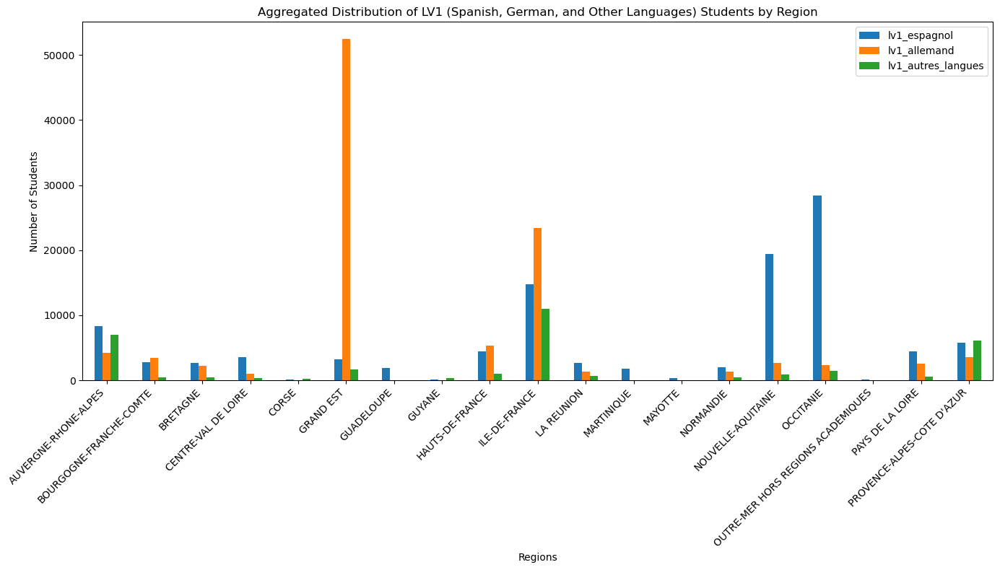

In [73]:
# Remove English from the plot to focus on the other languages (Spanish, German, and other languages)

aggregated_data_no_english = aggregated_data.drop(columns=['lv1_anglais'])

# Plot the data without English
aggregated_data_no_english.set_index('region_academique').plot(kind='bar', figsize=(14, 8))
plt.title("Aggregated Distribution of LV1 (Spanish, German, and Other Languages) Students by Region")
plt.xlabel("Regions")
plt.ylabel("Number of Students")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The chart highlights the strong prevalence of Spanish as a foreign language after English, particularly in regions such as Occitanie and Île-de-France. German, although less widely taught overall, stands out significantly in the Grand Est region, likely due to its proximity to Germany. Other foreign languages, while minority options, have a notable presence in specific regions.

**3) LV2 by Region:**

In [74]:
columns_LV2 = [col for col in data.columns if "lv2" in col.lower()]
columns_LV2

['2ndes_gt_lv2_allemand',
 '2ndes_gt_lv2_anglais',
 '2ndes_gt_lv2_espagnol',
 '2ndes_gt_lv2_italien',
 '2ndes_gt_lv2_autres_langues',
 '1eres_g_lv2_allemand',
 '1eres_g_lv2_anglais',
 '1eres_g_lv2_espagnol',
 '1eres_g_lv2_italien',
 '1eres_g_lv2_autres_langues',
 '1eres_sti2d_lv2_allemand',
 '1eres_sti2d_lv2_anglais',
 '1eres_sti2d_lv2_espagnol',
 '1eres_sti2d_lv2_italien',
 '1eres_sti2d_lv2_autres_langues',
 '1eres_stl_lv2_allemand',
 '1eres_stl_lv2_anglais',
 '1eres_stl_lv2_espagnol',
 '1eres_stl_lv2_italien',
 '1eres_stl_lv2_autres_langues',
 '1eres_stmg_lv2_allemand',
 '1eres_stmg_lv2_anglais',
 '1eres_stmg_lv2_espagnol',
 '1eres_stmg_lv2_italien',
 '1eres_stmg_lv2_autres_langues',
 '1eres_st2s_lv2_allemand',
 '1eres_st2s_lv2_anglais',
 '1eres_st2s_lv2_espagnol',
 '1eres_st2s_lv2_italien',
 '1eres_st2s_lv2_autres_langues',
 '1eres_std2a_lv2_allemand',
 '1eres_std2a_lv2_anglais',
 '1eres_std2a_lv2_espagnol',
 '1eres_std2a_lv2_italien',
 '1eres_std2a_lv2_autres_langues',
 'terminales

In [75]:
# Use the correct reference for the column names from the DataFrame
lv2_columns = data.columns[data.columns.str.contains('lv2', case=False, na=False)].tolist()

languages_aggregated = {
    'lv2_anglais': [col for col in lv2_columns if 'anglais' in col],
    'lv2_espagnol': [col for col in lv2_columns if 'espagnol' in col],
    'lv2_allemand': [col for col in lv2_columns if 'allemand' in col],
    'lv2_italien': [col for col in lv2_columns if 'italien' in col],
    'lv2_autres_langues': [col for col in lv2_columns if 'autres_langues' in col]
}

aggregated_data = pd.DataFrame()
aggregated_data['region_academique'] = data['region_academique'].unique()

# Sum the counts for each language across all the levels (columns) and regions
for language, columns in languages_aggregated.items():
    aggregated_data[language] = data.groupby('region_academique')[columns].sum().sum(axis=1).values

# Check the content of aggregated_data to ensure the sums are correct
aggregated_data.head()

,region_academique,lv2_anglais,lv2_espagnol,lv2_allemand,lv2_italien,lv2_autres_langues
0,AUVERGNE-RHONE-ALPES,19411,498559,135345,107601,9251.0
1,BOURGOGNE-FRANCHE-COMTE,6614,153653,62523,9212,1970.0
2,BRETAGNE,5263,249370,51601,6804,6132.0
3,CENTRE-VAL DE LOIRE,4795,176732,40655,3139,3183.0
4,CORSE,342,15689,461,8217,1625.0


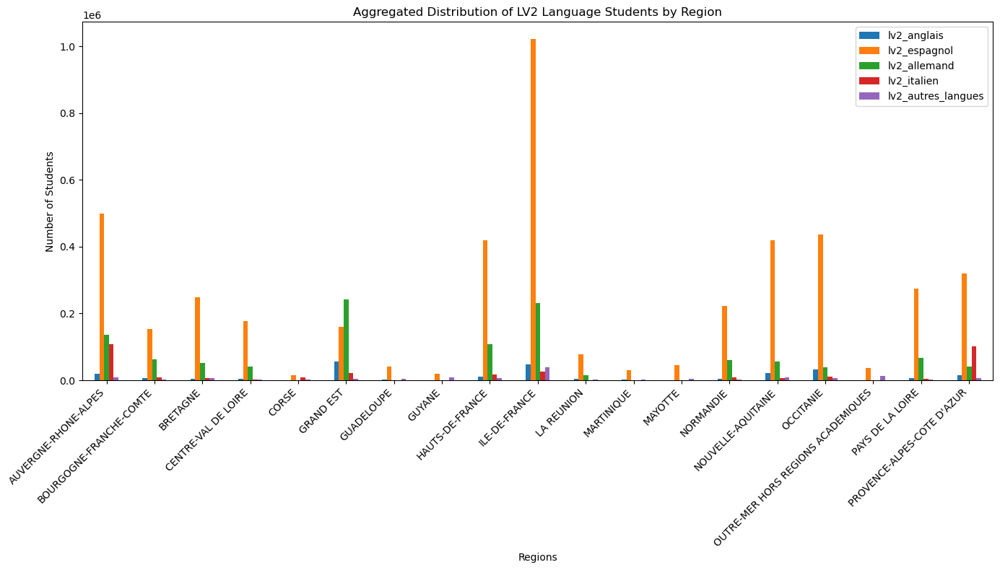

In [76]:
# Now that the data looks correctly aggregated, let's proceed with the plot

aggregated_data.set_index('region_academique').plot(kind='bar', figsize=(14, 8))
plt.title("Aggregated Distribution of LV2 Language Students by Region")
plt.xlabel("Regions")
plt.ylabel("Number of Students")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Spanish is the most commonly chosen second foreign language (LV2) in most French regions, reflecting its appeal as an international language. However, similar to English for LV1, its dominance overshadows the statistics of other languages.

**4) Without Spanish:**

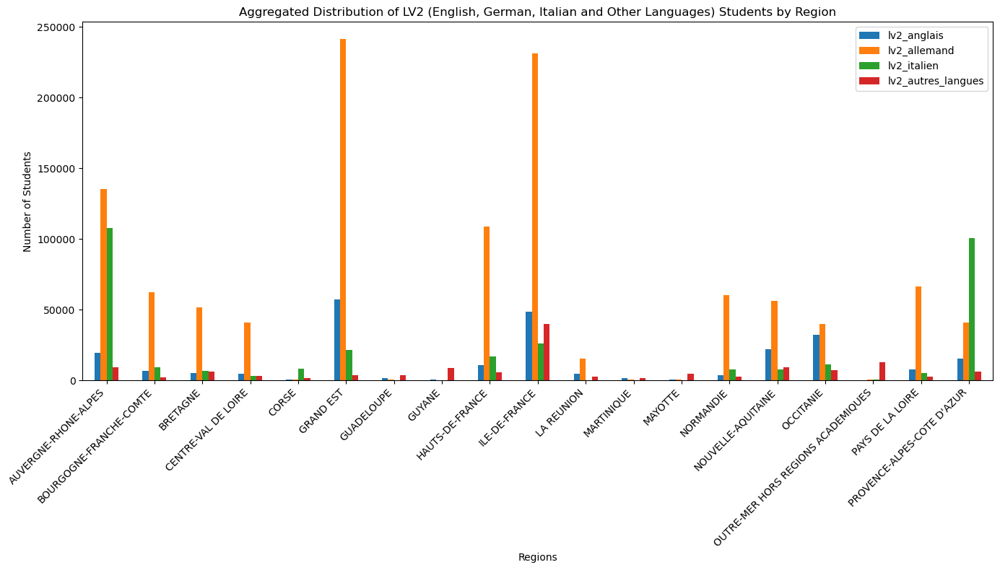

In [77]:
# Remove English from the plot to focus on the other languages (Spanish, German, and other languages)

aggregated_data_no_spanish= aggregated_data.drop(columns=['lv2_espagnol'])

# Plot the data without English
aggregated_data_no_spanish.set_index('region_academique').plot(kind='bar', figsize=(14, 8))
plt.title("Aggregated Distribution of LV2 (English, German, Italian and Other Languages) Students by Region")
plt.xlabel("Regions")
plt.ylabel("Number of Students")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

This chart reveals an interesting diversity in the choice of LV2 across French regions. While English remains dominant, languages such as German and Italian continue to hold an important place, often influenced by geographical and cultural factors. 'Other languages,' although marginal, play a key role in specific regions where cultural diversity and local needs influence the language offerings.

**5) Other Languages LV1 by Region:**

In [78]:
# Agrégons les colonnes des autres langues LV1 sur tous les niveaux
data['lv1_autres_langues_total'] = data[
    [
        '2ndes_gt_lv1_autres_langues',
        '1eres_g_lv1_autres_langues',
        '1eres_sti2d_lv1_autres_langues',
        '1eres_stl_lv1_autres_langues',
        '1eres_stmg_lv1_autres_langues',
        '1eres_st2s_lv1_autres_langues',
        '1eres_std2a_lv1_autres_langues',
        'terminales_g_lv1_autres_langues',
        'terminales_sti2d_lv1_autres_langues',
        'terminales_stl_lv1_autres_langues',
        'terminales_stmg_lv1_autres_langues',
        'terminales_st2s_lv1_autres_langues',
        'terminales_std2a_lv1_autres_langues'
    ]
].sum(axis=1)

# Grouper par département et calculer le total des autres langues par département
aggregated_data = data.groupby('code_departement_pays').agg(
    lv1_autres_langues_total=('lv1_autres_langues_total', 'sum')
).reset_index()

# Renommer la colonne pour correspondre à la colonne du GeoJSON
aggregated_data.rename(columns={'code_departement_pays': 'code'}, inplace=True)

# Vérifier le résultat avant la visualisation
aggregated_data.head()

,code,lv1_autres_langues_total
0,2,5
1,4,139
2,5,141
3,6,516
4,8,0


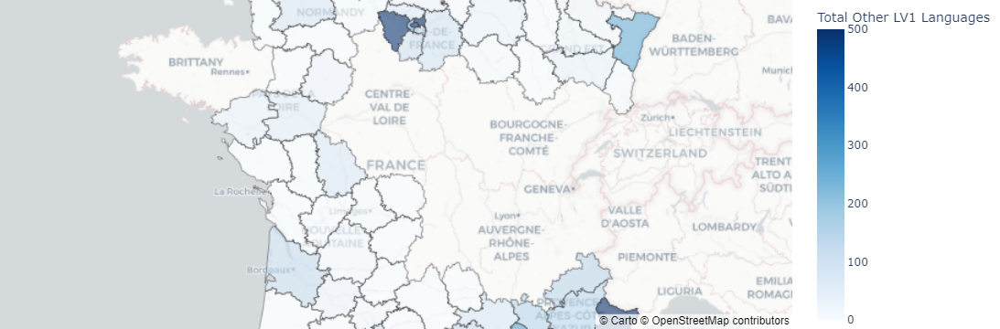

In [79]:
geojson_file_path = 'departements.geojson'
with open(geojson_file_path) as f:
    geojson = json.load(f)
    
# Convertir les codes départements en chaînes de caractères à deux chiffres pour correspondre au GeoJSON
aggregated_data['code'] = aggregated_data['code'].apply(lambda x: str(x).zfill(2))

# Ajuster la plage de couleur pour rendre l'échelle plus discernable
fig = px.choropleth_mapbox(
    aggregated_data,  # DataFrame contenant les données agrégées
    geojson=geojson,  # Fichier GeoJSON des départements
    locations='code',  # Colonne des codes départements dans les données
    featureidkey="properties.code",  # Clé d'identification dans le GeoJSON
    color='lv1_autres_langues_total',  # Colonne pour la couleur
    color_continuous_scale="Blues",  # Palette de couleurs
    range_color=(0, 500),  # Ajustement de la plage de couleurs pour une meilleure distinction
    mapbox_style="carto-positron",  # Style de la carte
    zoom=5,  # Niveau de zoom initial
    center={"lat": 46.603354, "lon": 1.888334},  # Coordonnées centrales (France)
    opacity=0.6,  # Transparence des zones colorées
    labels={'lv1_autres_langues_total': 'Total Other LV1 Languages'}  # Étiquette de la légende
)

# Ajustement des marges et affichage
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


This choropleth map shows the geographical distribution of students who have chosen a less common first foreign language (LV1), excluding major languages such as English, Spanish, and German. The map highlights departments with a higher concentration of these other LV1s, represented by a darker color intensity.

* Geographical concentration: Other foreign languages (such as Portuguese, Chinese, Russian, or Japanese) are particularly present in certain departments, with peaks in regions like Brittany, Île-de-France, and parts of Eastern France.
  
* Cultural and demographic impact: This distribution could be influenced by the presence of specific communities or by more diverse educational choices in these regions. For example, Île-de-France is a cosmopolitan region with great cultural diversity, which may explain a broader teaching of less common languages.

**6) Other Languages LV2 by Region:**

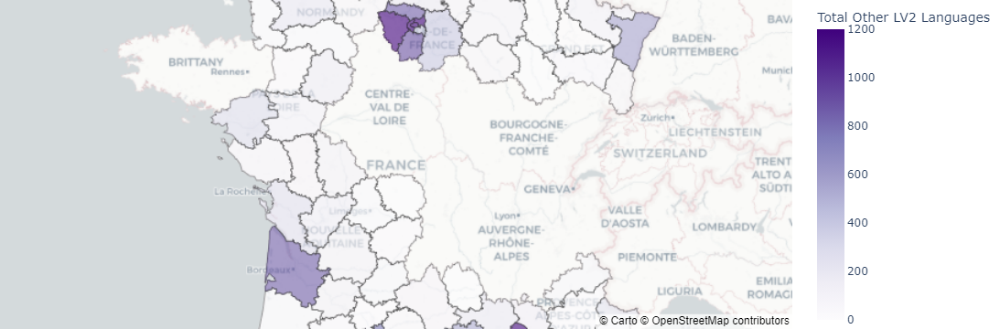

In [80]:
# Agrégons les colonnes des autres langues LV2 sur tous les niveaux
lv2_columns = [col for col in data.columns if 'lv2_autres_langues' in col]

# Créer une nouvelle colonne pour total des autres langues LV2
data['lv2_autres_langues_total'] = data[lv2_columns].sum(axis=1)

# Grouper par département et calculer le total des autres langues LV2 par département
aggregated_data_lv2 = data.groupby('code_departement_pays').agg(
    lv2_autres_langues_total=('lv2_autres_langues_total', 'sum')
).reset_index()

# Renommer la colonne pour correspondre à la colonne du GeoJSON
aggregated_data_lv2.rename(columns={'code_departement_pays': 'code'}, inplace=True)

# Convertir les codes départements en chaînes de caractères à deux chiffres pour correspondre au GeoJSON
aggregated_data_lv2['code'] = aggregated_data_lv2['code'].apply(lambda x: str(x).zfill(2))

# Création de la carte avec Plotly pour LV2
fig_lv2 = px.choropleth_mapbox(
    aggregated_data_lv2,  # DataFrame contenant les données agrégées
    geojson=geojson,  # Fichier GeoJSON des départements
    locations='code',  # Colonne des codes départements dans les données
    featureidkey="properties.code",  # Clé d'identification dans le GeoJSON
    color='lv2_autres_langues_total',  # Colonne pour la couleur
    color_continuous_scale="Purples",  # Palette de couleurs
    range_color=(0, 1200),  # Ajustement de la plage de couleurs pour une meilleure distinction
    mapbox_style="carto-positron",  # Style de la carte
    zoom=5,  # Niveau de zoom initial
    center={"lat": 46.603354, "lon": 1.888334},  # Coordonnées centrales (France)
    opacity=0.6,  # Transparence des zones colorées
    labels={'lv2_autres_langues_total': 'Total Other LV2 Languages'}  # Étiquette de la légende
)

# Ajustement des marges et affichage
fig_lv2.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_lv2.show()

The geographical distribution of less common second foreign languages (LV2) in France, as shown on the map, can be influenced by several factors. First, the presence of specific cultural and ethnic communities in certain regions, particularly in Île-de-France or the northeast, promotes the learning of languages like Portuguese, Chinese, or Russian. Additionally, regional economic and commercial needs can encourage the teaching of certain languages linked to international trade (for example, German in the Grand Est). Regional educational policies and the linguistic offerings available in schools also play a key role, as does the geographical proximity to certain countries, which encourages the learning of neighboring languages. Finally, the attractiveness of certain languages in professional, cultural, or academic sectors influences the choices made by students and families.

# Languages

**1) LV1 Based on Track:**

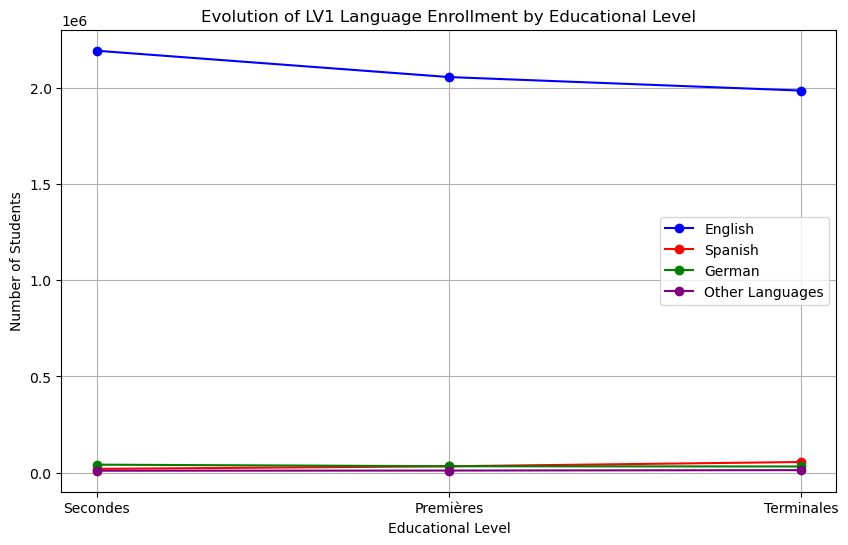

In [81]:
# Step 1: Identify columns for each educational level and language
lv1_english_secondes = [col for col in data.columns if '2ndes' in col and 'lv1_anglais' in col]
lv1_english_premieres = [col for col in data.columns if '1eres' in col and 'lv1_anglais' in col]
lv1_english_terminales = [col for col in data.columns if 'terminales' in col and 'lv1_anglais' in col]

lv1_spanish_secondes = [col for col in data.columns if '2ndes' in col and 'lv1_espagnol' in col]
lv1_spanish_premieres = [col for col in data.columns if '1eres' in col and 'lv1_espagnol' in col]
lv1_spanish_terminales = [col for col in data.columns if 'terminales' in col and 'lv1_espagnol' in col]

lv1_german_secondes = [col for col in data.columns if '2ndes' in col and 'lv1_allemand' in col]
lv1_german_premieres = [col for col in data.columns if '1eres' in col and 'lv1_allemand' in col]
lv1_german_terminales = [col for col in data.columns if 'terminales' in col and 'lv1_allemand' in col]

lv1_other_secondes = [col for col in data.columns if '2ndes' in col and 'lv1_autres_langues' in col]
lv1_other_premieres = [col for col in data.columns if '1eres' in col and 'lv1_autres_langues' in col]
lv1_other_terminales = [col for col in data.columns if 'terminales' in col and 'lv1_autres_langues' in col]

# Step 2: Sum the number of students for each language and level
english_students = [data[lv1_english_secondes].sum().sum(), data[lv1_english_premieres].sum().sum(), data[lv1_english_terminales].sum().sum()]
spanish_students = [data[lv1_spanish_secondes].sum().sum(), data[lv1_spanish_premieres].sum().sum(), data[lv1_spanish_terminales].sum().sum()]
german_students = [data[lv1_german_secondes].sum().sum(), data[lv1_german_premieres].sum().sum(), data[lv1_german_terminales].sum().sum()]
other_students = [data[lv1_other_secondes].sum().sum(), data[lv1_other_premieres].sum().sum(), data[lv1_other_terminales].sum().sum()]

levels = ['Secondes', 'Premières', 'Terminales']

plt.figure(figsize=(10, 6))

plt.plot(levels, english_students, marker='o', label='English', color='blue')
plt.plot(levels, spanish_students, marker='o', label='Spanish', color='red')
plt.plot(levels, german_students, marker='o', label='German', color='green')
plt.plot(levels, other_students, marker='o', label='Other Languages', color='purple')

plt.xlabel('Educational Level')
plt.ylabel('Number of Students')
plt.title('Evolution of LV1 Language Enrollment by Educational Level')
plt.legend()
plt.grid(True)

plt.show()

**2) English Set Aside:**

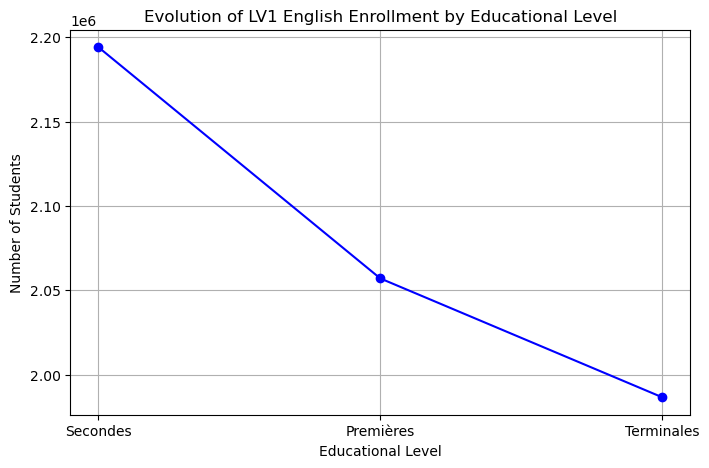

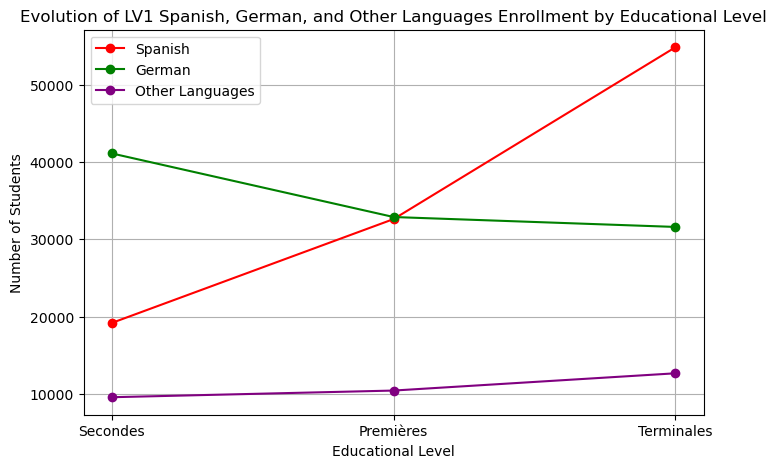

In [82]:
# Plot for English
plt.figure(figsize=(8, 5))
plt.plot(levels, english_students, marker='o', label='English', color='blue')
plt.xlabel('Educational Level')
plt.ylabel('Number of Students')
plt.title('Evolution of LV1 English Enrollment by Educational Level')
plt.grid(True)
plt.show()

# Plot for Spanish, German, and Other Languages
plt.figure(figsize=(8, 5))
plt.plot(levels, spanish_students, marker='o', label='Spanish', color='red')
plt.plot(levels, german_students, marker='o', label='German', color='green')
plt.plot(levels, other_students, marker='o', label='Other Languages', color='purple')

plt.xlabel('Educational Level')
plt.ylabel('Number of Students')
plt.title('Evolution of LV1 Spanish, German, and Other Languages Enrollment by Educational Level')
plt.legend()
plt.grid(True)
plt.show()

* English: There is a continuous decline in the number of students enrolled in English from the second year to the final year of high school. Although English remains the most studied language, this decrease could be explained by students dropping LV1 in their final year, choosing a specialization, or switching to another language in certain curricula.

* Spanish: Unlike English, Spanish shows a constant increase in the number of students from the second year to the final year of high school, indicating its growing popularity as students advance in their academic journey.

* German: The number of students studying German slightly decreases over the years, which could be linked to a loss of interest or educational choices that favor other languages.

* Other languages: Although less common, other languages show a slight increase, which may suggest a gradual diversification of language choices.

**3) LV2 Evolution in the Track:**

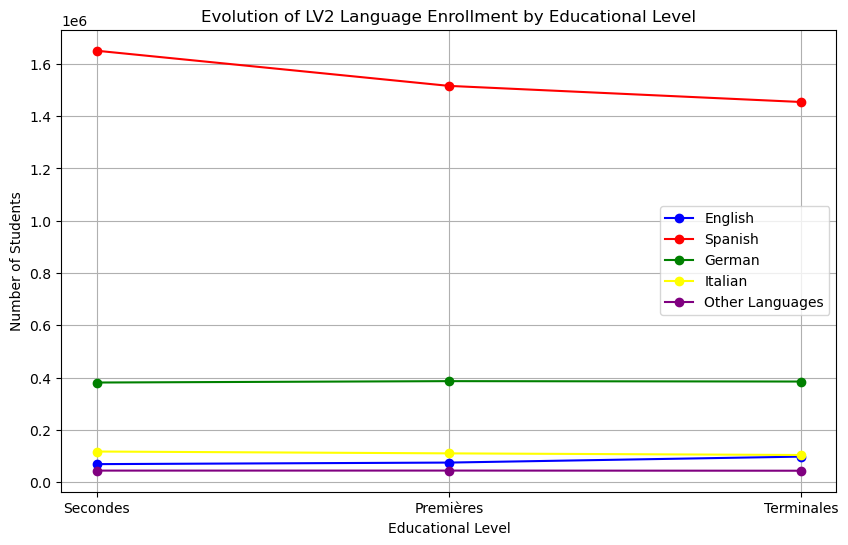

In [83]:
# Step 1: Identify columns for each educational level and language
lv2_english_secondes = [col for col in data.columns if '2ndes' in col and 'lv2_anglais' in col]
lv2_english_premieres = [col for col in data.columns if '1eres' in col and 'lv2_anglais' in col]
lv2_english_terminales = [col for col in data.columns if 'terminales' in col and 'lv2_anglais' in col]

lv2_spanish_secondes = [col for col in data.columns if '2ndes' in col and 'lv2_espagnol' in col]
lv2_spanish_premieres = [col for col in data.columns if '1eres' in col and 'lv2_espagnol' in col]
lv2_spanish_terminales = [col for col in data.columns if 'terminales' in col and 'lv2_espagnol' in col]

lv2_german_secondes = [col for col in data.columns if '2ndes' in col and 'lv2_allemand' in col]
lv2_german_premieres = [col for col in data.columns if '1eres' in col and 'lv2_allemand' in col]
lv2_german_terminales = [col for col in data.columns if 'terminales' in col and 'lv2_allemand' in col]

lv2_italian_secondes = [col for col in data.columns if '2ndes' in col and 'lv2_italien' in col]
lv2_italian_premieres = [col for col in data.columns if '1eres' in col and 'lv2_italien' in col]
lv2_italian_terminales = [col for col in data.columns if 'terminales' in col and 'lv2_italien' in col]

lv2_other_secondes = [col for col in data.columns if '2ndes' in col and 'lv2_autres_langues' in col]
lv2_other_premieres = [col for col in data.columns if '1eres' in col and 'lv2_autres_langues' in col]
lv2_other_terminales = [col for col in data.columns if 'terminales' in col and 'lv2_autres_langues' in col]

# Step 2: Sum the number of students for each language and level
english_students = [data[lv2_english_secondes].sum().sum(), data[lv2_english_premieres].sum().sum(), data[lv2_english_terminales].sum().sum()]
spanish_students = [data[lv2_spanish_secondes].sum().sum(), data[lv2_spanish_premieres].sum().sum(), data[lv2_spanish_terminales].sum().sum()]
german_students = [data[lv2_german_secondes].sum().sum(), data[lv2_german_premieres].sum().sum(), data[lv2_german_terminales].sum().sum()]
italian_students = [data[lv2_italian_secondes].sum().sum(), data[lv2_italian_premieres].sum().sum(), data[lv2_italian_terminales].sum().sum()]
other_students = [data[lv2_other_secondes].sum().sum(), data[lv2_other_premieres].sum().sum(), data[lv2_other_terminales].sum().sum()]

levels = ['Secondes', 'Premières', 'Terminales']

plt.figure(figsize=(10, 6))

plt.plot(levels, english_students, marker='o', label='English', color='blue')
plt.plot(levels, spanish_students, marker='o', label='Spanish', color='red')
plt.plot(levels, german_students, marker='o', label='German', color='green')
plt.plot(levels, italian_students, marker='o', label='Italian', color='yellow')
plt.plot(levels, other_students, marker='o', label='Other Languages', color='purple')

plt.xlabel('Educational Level')
plt.ylabel('Number of Students')
plt.title('Evolution of LV2 Language Enrollment by Educational Level')
plt.legend()
plt.grid(True)

plt.show()

**4) Spanish Set Aside:**

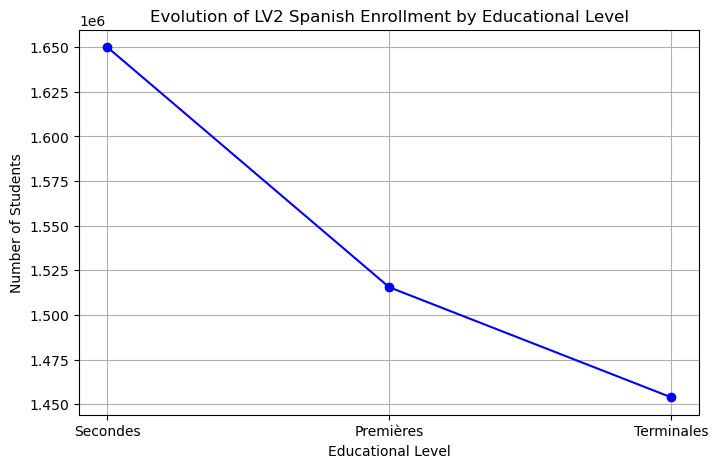

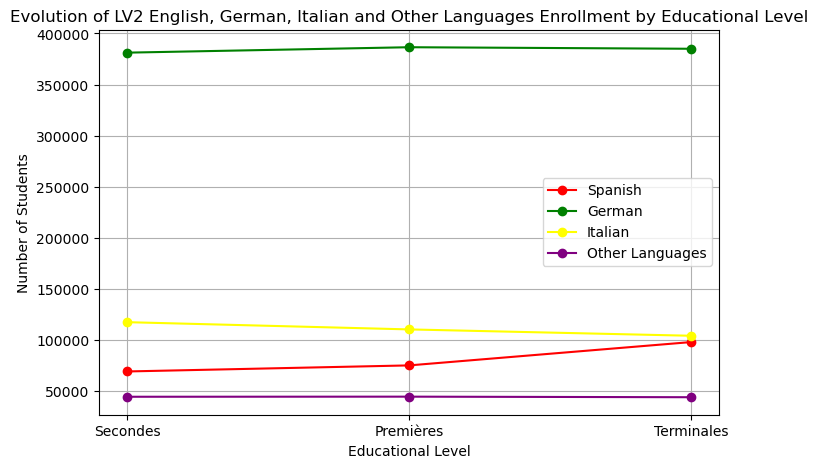

In [84]:
# Plot for Spanish
plt.figure(figsize=(8, 5))
plt.plot(levels, spanish_students, marker='o', label='English', color='blue')
plt.xlabel('Educational Level')
plt.ylabel('Number of Students')
plt.title('Evolution of LV2 Spanish Enrollment by Educational Level')
plt.grid(True)
plt.show()

# Plot for Spanish, German, and Other Languages
plt.figure(figsize=(8, 5))
plt.plot(levels, english_students, marker='o', label='Spanish', color='red')
plt.plot(levels, german_students, marker='o', label='German', color='green')
plt.plot(levels, italian_students, marker='o', label='Italian', color='yellow')
plt.plot(levels, other_students, marker='o', label='Other Languages', color='purple')

plt.xlabel('Educational Level')
plt.ylabel('Number of Students')
plt.title('Evolution of LV2 English, German, Italian and Other Languages Enrollment by Educational Level')
plt.legend()
plt.grid(True)
plt.show()

* Spanish: The number of students enrolled in Spanish LV2 gradually decreases from the second year to the final year of high school. This decrease could be explained by the fact that some students drop LV2 over the years, either due to specialization or by choosing to lighten their workload.

* English: Unlike Spanish, English LV2 shows a certain stability throughout the school years, although the popularity of English in LV1 limits its appeal in LV2.
  
* German: German, while remaining stable, sees a slight increase in enrollment during the final year, which may be related to specialization options or the continuation of the language in high school.
  
* Italian: The number of students enrolled in Italian is generally stable, with no significant variations.
  
* Other languages: Other LV2 languages (such as Chinese, Portuguese, etc.) show a trend toward stability or a slight increase, but remain marginal compared to other more popular languages.

**5) LV1 Over the Years:**

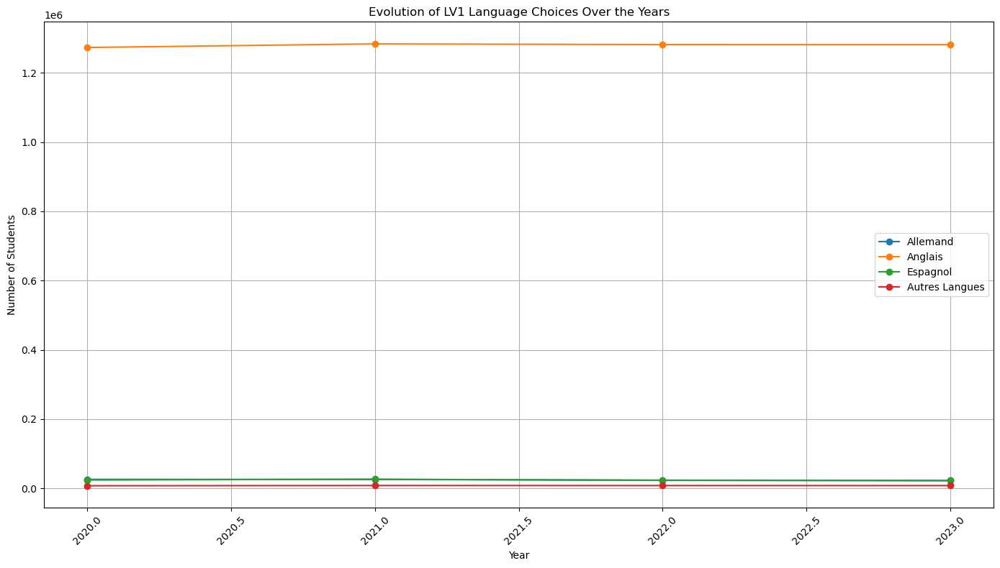

In [85]:
# Define the LV1 columns for each level
lv1_columns = {
    '2nde': ['2ndes_gt_lv1_allemand', '2ndes_gt_lv1_anglais', '2ndes_gt_lv1_espagnol', '2ndes_gt_lv1_autres_langues'],
    '1ere': ['1eres_g_lv1_allemand', '1eres_g_lv1_anglais', '1eres_g_lv1_espagnol', '1eres_g_lv1_autres_langues'],
    'term': ['terminales_g_lv1_allemand', 'terminales_g_lv1_anglais', 'terminales_g_lv1_espagnol', 'terminales_g_lv1_autres_langues']
}

# Aggregate the language columns across all levels
languages_aggregated = {
    'lv1_anglais': [col for level in lv1_columns.values() for col in level if 'anglais' in col],
    'lv1_espagnol': [col for level in lv1_columns.values() for col in level if 'espagnol' in col],
    'lv1_allemand': [col for level in lv1_columns.values() for col in level if 'allemand' in col],
    'lv1_autres_langues': [col for level in lv1_columns.values() for col in level if 'autres_langues' in col]
}

# Convert relevant LV1 columns to numeric, coercing errors to NaN, then fill NaN with 0
for language, columns in languages_aggregated.items():
    data[columns] = data[columns].apply(pd.to_numeric, errors='coerce').fillna(0)

# Create an empty DataFrame to hold the evolution data
evolution_data = pd.DataFrame()

# Loop through each language and aggregate the data by 'rentree_scolaire'
for language, columns in languages_aggregated.items():
    # Sum the number of students choosing each language across the levels
    evolution_data[language] = data.groupby('rentree_scolaire')[columns].sum().sum(axis=1)

# Reset index for plotting
evolution_data = evolution_data.reset_index()

# Visualize the evolution of LV1 language choices over the years
plt.figure(figsize=(14, 8))

plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_allemand'], label='Allemand', marker='o')
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_anglais'], label='Anglais', marker='o')
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_espagnol'], label='Espagnol', marker='o')
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_autres_langues'], label='Autres Langues', marker='o')

plt.title('Evolution of LV1 Language Choices Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Students')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

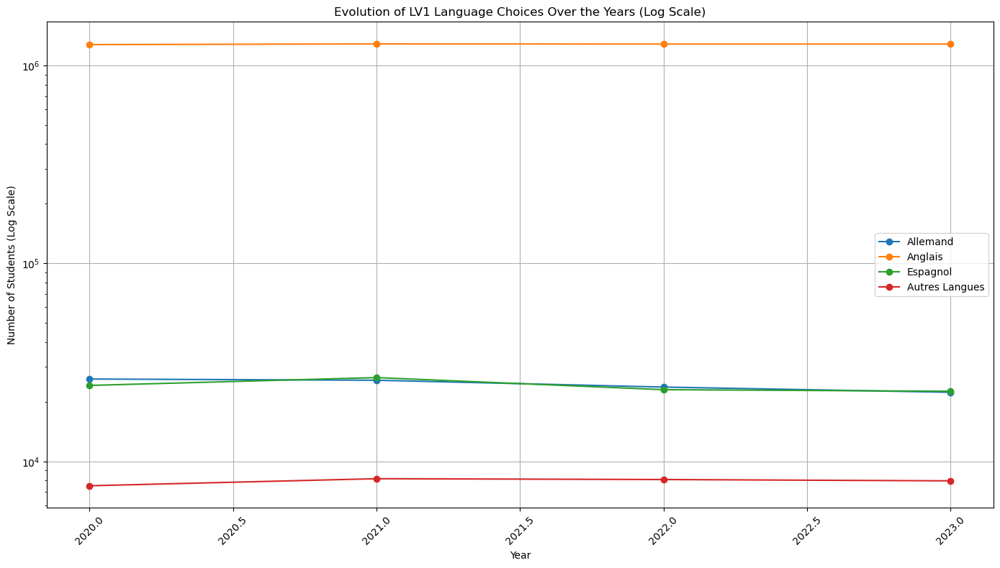

In [86]:
# Visualize the evolution of LV1 language choices over the years with a log scale
plt.figure(figsize=(14, 8))

plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_allemand'], label='Allemand', marker='o')
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_anglais'], label='Anglais', marker='o')
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_espagnol'], label='Espagnol', marker='o')
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_autres_langues'], label='Autres Langues', marker='o')

plt.yscale('log')  # Apply logarithmic scale to the y-axis

plt.title('Evolution of LV1 Language Choices Over the Years (Log Scale)')
plt.xlabel('Year')
plt.ylabel('Number of Students (Log Scale)')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

**6) English Set Aside:**

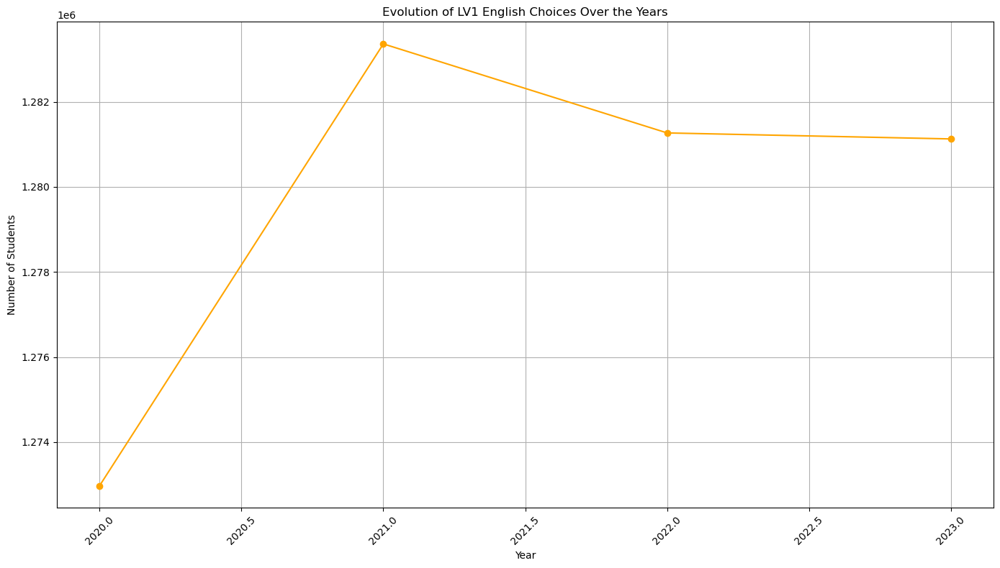

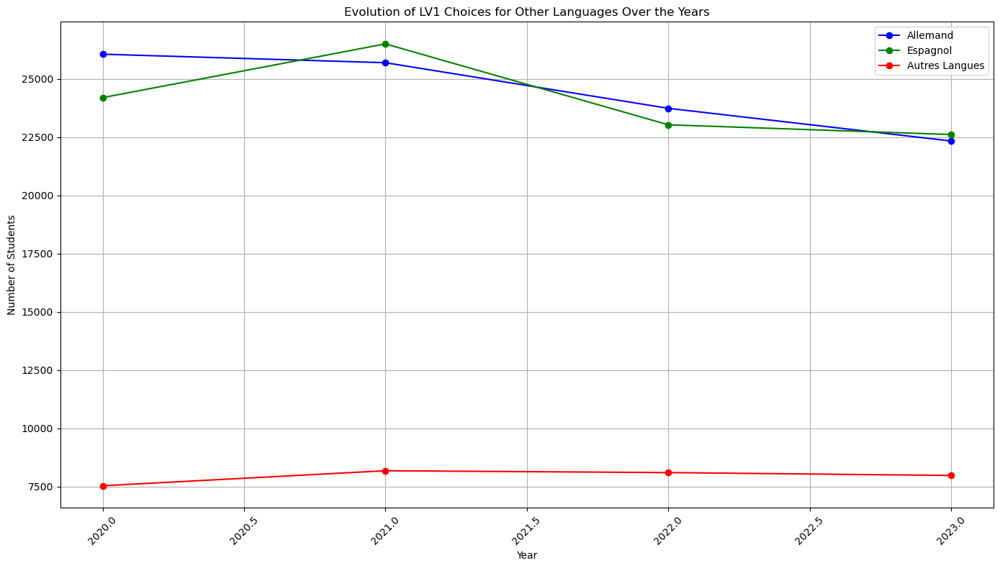

In [87]:
# Plot for English separately
plt.figure(figsize=(14, 8))
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_anglais'], label='Anglais', marker='o', color='orange')
plt.title('Evolution of LV1 English Choices Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Students')
plt.xticks(rotation=45)
plt.grid()
plt.tight_layout()
plt.show()

# Plot for other languages
plt.figure(figsize=(14, 8))
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_allemand'], label='Allemand', marker='o', color='blue')
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_espagnol'], label='Espagnol', marker='o', color='green')
plt.plot(evolution_data['rentree_scolaire'], evolution_data['lv1_autres_langues'], label='Autres Langues', marker='o', color='red')

plt.title('Evolution of LV1 Choices for Other Languages Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Students')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

**1. Evolution of English Enrollment (LV1)**
   
A significant increase is observed until 2019, reaching a peak of over 1.28 million students. However, this trend has reversed, showing a slight decline in enrollments afterward. 
This situation could be attributed to several factors:

* Market Saturation: With English already widely taught, new students may choose other languages to diversify their learning.
Shifts in Interests: Students may be influenced by a growing interest in other languages, particularly Spanish, which is becoming increasingly popular.

* Curriculum Changes: Changes in school programs may also play a role in the decline of enrollments.

**2. Enrollments in Other Languages (German, Spanish, and Others)**
   
It is observed that:

* German: Enrollments in German remain relatively stable over the years. Although the number of students is not as high as for English or Spanish, German maintains a steady base of students, which could be linked to geographical proximity to Germany and economic relations.

* Spanish: Spanish continues to attract an increasing number of students, as evident in the upward trend in enrollments. This highlights the growing appeal of Spanish, possibly due to cultural influences and the increasing importance of Spain and Latin America in international and economic relations.

* Other Languages: Enrollments for other languages remain marginal but show some stability. This may indicate that students have an interest in less common languages, even though they represent only a small portion of the choices.

**3. Comparison and Conclusions**
   
Overall, English remains the most chosen living language, but its appeal seems to be diminishing. In contrast, Spanish is gaining importance, while German and other languages maintain their place without significant growth. This linguistic dynamic reflects not only individual student choices but also broader cultural, economic, and social influences that shape language preferences. The trend towards a diversification of language choices is a positive sign for cultural enrichment, although the dominance of English in the French educational system remains a concern to monitor.

**7) LV2 Over Time:**

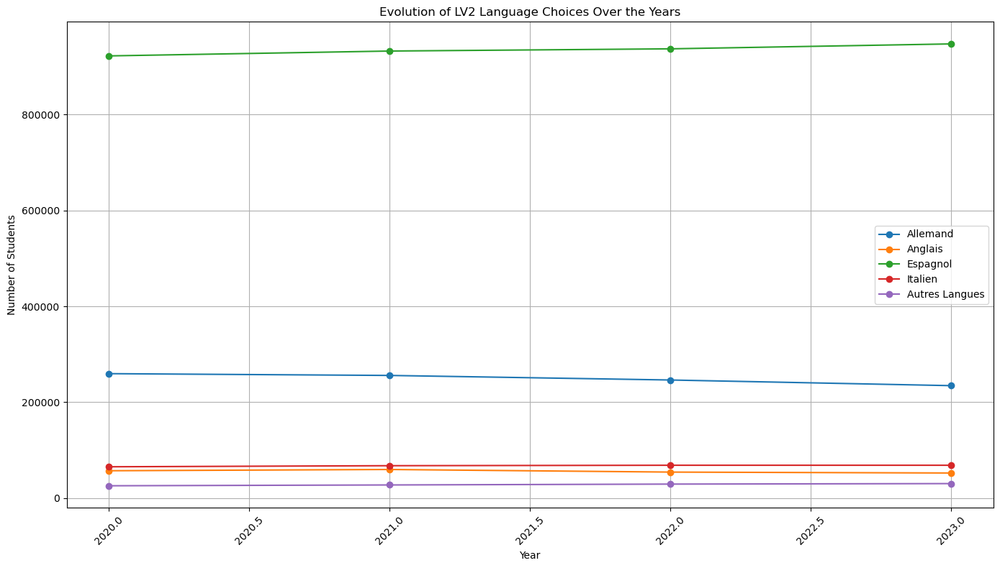

In [88]:
# Define the LV2 columns for each level, including Italian
lv2_columns = {
    '2nde': ['2ndes_gt_lv2_allemand', '2ndes_gt_lv2_anglais', '2ndes_gt_lv2_espagnol', '2ndes_gt_lv2_italien', '2ndes_gt_lv2_autres_langues'],
    '1ere': ['1eres_g_lv2_allemand', '1eres_g_lv2_anglais', '1eres_g_lv2_espagnol', '1eres_g_lv2_italien', '1eres_g_lv2_autres_langues'],
    'term': ['terminales_g_lv2_allemand', 'terminales_g_lv2_anglais', 'terminales_g_lv2_espagnol', 'terminales_g_lv2_italien', 'terminales_g_lv2_autres_langues']
}

# Aggregate the language columns across all levels for LV2, including Italian
languages_aggregated_lv2 = {
    'lv2_anglais': [col for level in lv2_columns.values() for col in level if 'anglais' in col],
    'lv2_espagnol': [col for level in lv2_columns.values() for col in level if 'espagnol' in col],
    'lv2_allemand': [col for level in lv2_columns.values() for col in level if 'allemand' in col],
    'lv2_italien': [col for level in lv2_columns.values() for col in level if 'italien' in col],
    'lv2_autres_langues': [col for level in lv2_columns.values() for col in level if 'autres_langues' in col]
}

# Convert relevant LV2 columns to numeric, coercing errors to NaN, then fill NaN with 0
for language, columns in languages_aggregated_lv2.items():
    data[columns] = data[columns].apply(pd.to_numeric, errors='coerce').fillna(0)

# Create an empty DataFrame to hold the evolution data
evolution_data_lv2 = pd.DataFrame()

# Loop through each language and aggregate the data by 'rentree_scolaire'
for language, columns in languages_aggregated_lv2.items():
    # Sum the number of students choosing each language across the levels
    evolution_data_lv2[language] = data.groupby('rentree_scolaire')[columns].sum().sum(axis=1)

# Reset index for plotting
evolution_data_lv2 = evolution_data_lv2.reset_index()

# Visualize the evolution of LV2 language choices over the years
plt.figure(figsize=(14, 8))

plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_allemand'], label='Allemand', marker='o')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_anglais'], label='Anglais', marker='o')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_espagnol'], label='Espagnol', marker='o')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_italien'], label='Italien', marker='o')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_autres_langues'], label='Autres Langues', marker='o')

plt.title('Evolution of LV2 Language Choices Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Students')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

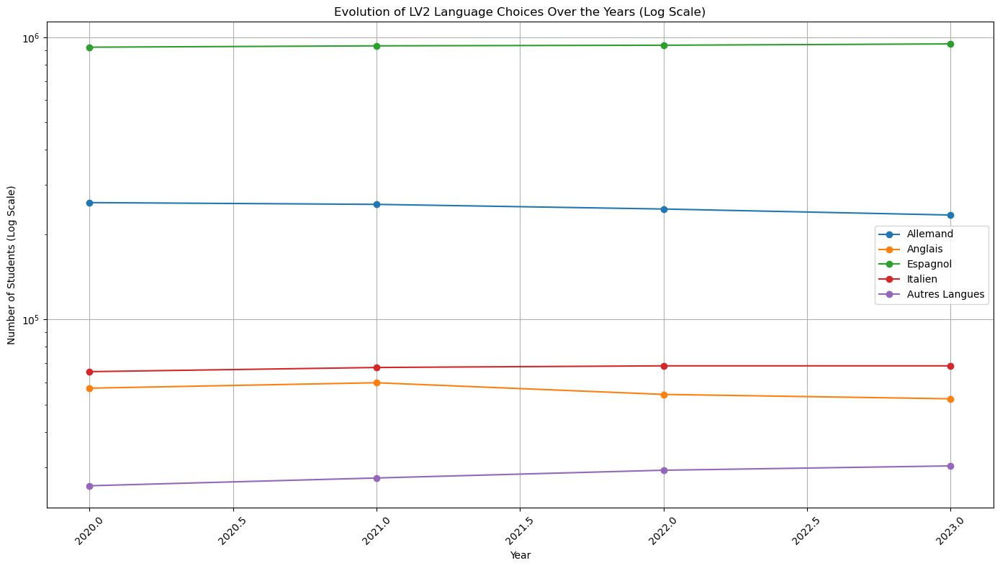

In [89]:
# Visualize the evolution of LV2 language choices over the years with a log scale
plt.figure(figsize=(14, 8))

plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_allemand'], label='Allemand', marker='o')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_anglais'], label='Anglais', marker='o')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_espagnol'], label='Espagnol', marker='o')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_italien'], label='Italien', marker='o')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_autres_langues'], label='Autres Langues', marker='o')

plt.yscale('log')  # Apply logarithmic scale to the y-axis

plt.title('Evolution of LV2 Language Choices Over the Years (Log Scale)')
plt.xlabel('Year')
plt.ylabel('Number of Students (Log Scale)')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

**8) Spanish Set Aside:**

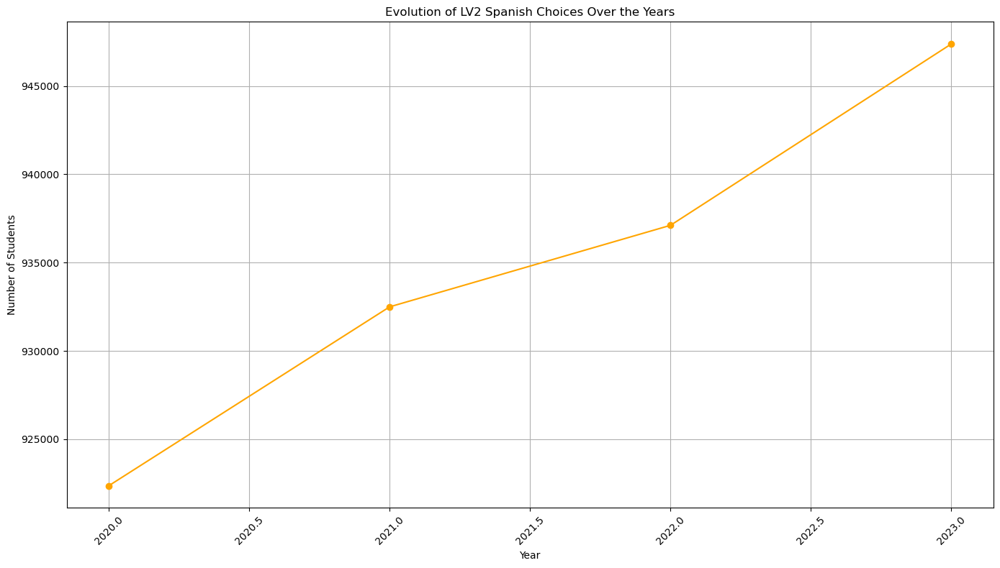

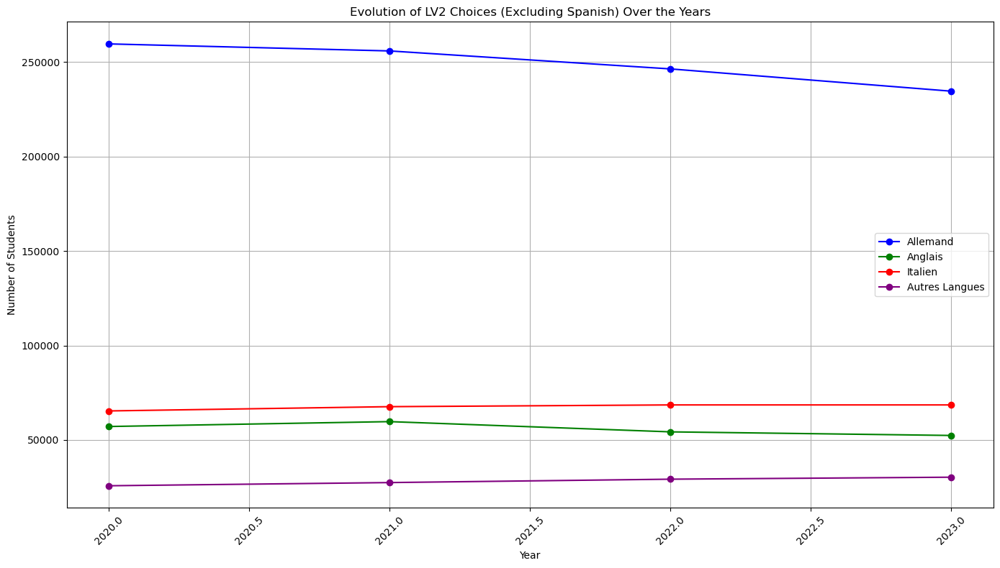

In [90]:
# Plot for Spanish (Espagnol) separately
plt.figure(figsize=(14, 8))

# Plot the trend for LV2 Spanish over the years
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_espagnol'], label='Espagnol', marker='o', color='orange')

plt.title('Evolution of LV2 Spanish Choices Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Students')
plt.xticks(rotation=45)
plt.grid()
plt.tight_layout()
plt.show()

# Plot for the other languages (except Spanish)
plt.figure(figsize=(14, 8))

# Plot the trends for other LV2 languages (excluding Spanish)
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_allemand'], label='Allemand', marker='o', color='blue')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_anglais'], label='Anglais', marker='o', color='green')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_italien'], label='Italien', marker='o', color='red')
plt.plot(evolution_data_lv2['rentree_scolaire'], evolution_data_lv2['lv2_autres_langues'], label='Autres Langues', marker='o', color='purple')

plt.title('Evolution of LV2 Choices (Excluding Spanish) Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Students')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

**1. Evolution of LV2 Spanish Choices**

There is a clear upward trajectory, indicating a growing interest in Spanish among students:

* Increasing Popularity: The increase in Spanish enrollments suggests that students are increasingly recognizing the value of Spanish as a vital communication skill, possibly influenced by the growing Hispanic population in many countries and the importance of Spanish in international business and cultural exchanges.

* Cultural Influences: Factors such as exposure to Spanish-speaking media, music, and cultural events may be contributing to the rise in student interest in Spanish. The perceived relevance of Spanish in contemporary society might encourage students to continue their studies in this language.

* Competitive Language Choice: The growth in Spanish enrollments could also be seen as a response to competition among living languages. As more students opt for Spanish, it may also encourage schools to invest more resources in Spanish programs, further solidifying its position as a desirable language choice.

**2. Evolution of LV2 Choices Excluding Spanish**

* Stability with a Decline: The overall enrollment in other languages appears to be relatively stable, with a slight decline over the years. This trend indicates that while students may be maintaining their interest in these languages, the growth rate does not match that of Spanish, which is on the rise.

* English as a Secondary Language: Although English is generally a popular language, its demand as a second language appears to be plateauing. Many students may already have chosen English as their first language (LV1), which could lead to less enthusiasm for it as a secondary choice.

* German and Italian Trends: The numbers for German and Italian show minor fluctuations but do not demonstrate any significant growth. This could suggest that while these languages maintain a consistent student base, they are not attracting new students at the same rate as Spanish.

* Minor Languages: The category of "other languages" remains relatively minor and stable, indicating that there is some interest in languages that are not as commonly taught, but they do not have a significant impact on the overall landscape of language choices.

**3. Comparative Analysis and Conclusions**

Overall, the data suggests that Spanish is on the rise as a second language choice, reflecting broader cultural and educational trends. In contrast, other language choices are experiencing stagnation or slight declines.

The contrast between the growth in Spanish and the relative stability of other languages could imply that schools and educational systems may need to reassess their language offerings to better meet student demand and preferences.

The growth of Spanish could also lead to a shift in curriculum focus, encouraging institutions to provide more resources and support for Spanish language programs while considering how to attract students to other languages.

Additionally, understanding these trends can help educators and policymakers in addressing language education strategies and enhancing language learning experiences, ensuring they align with current student interests and societal needs.

**9) LV1/LV2 Combinations:**

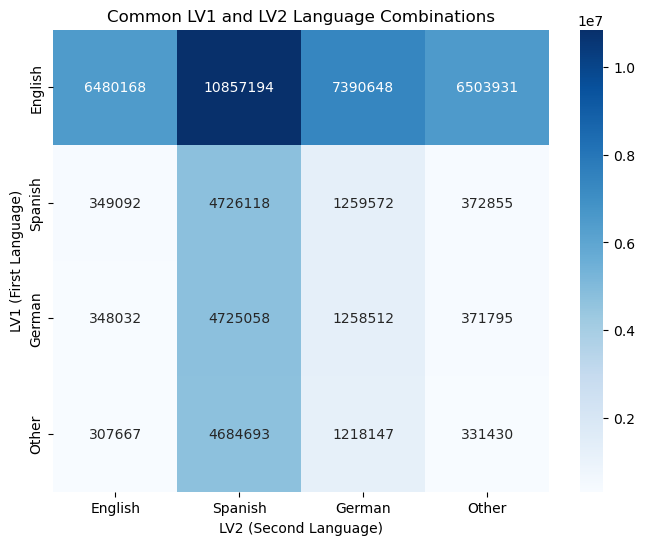

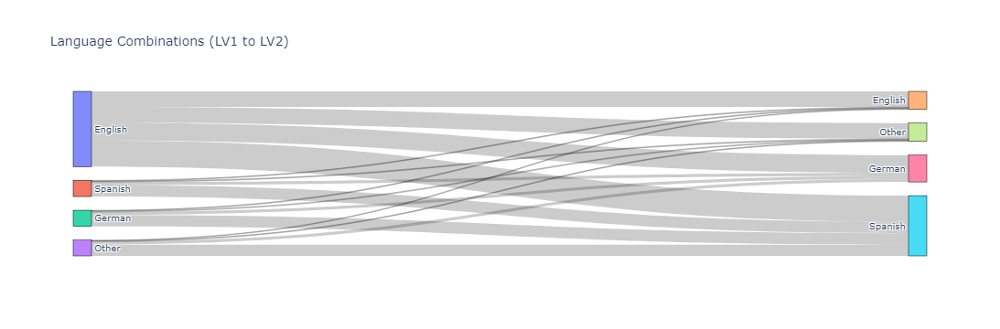

In [91]:
# Step 1: Identify LV1 and LV2 columns for each language
lv1_columns = {
    'English': [col for col in data.columns if 'lv1_anglais' in col],
    'Spanish': [col for col in data.columns if 'lv1_espagnol' in col],
    'German': [col for col in data.columns if 'lv1_allemand' in col],
    'Other': [col for col in data.columns if 'lv1_autres_langues' in col]
}

lv2_columns = {
    'English': [col for col in data.columns if 'lv2_anglais' in col],
    'Spanish': [col for col in data.columns if 'lv2_espagnol' in col],
    'German': [col for col in data.columns if 'lv2_allemand' in col],
    'Other': [col for col in data.columns if 'lv2_autres_langues' in col]
}

# Step 2: Create a DataFrame to store the total number of students for each LV1 and LV2 combination
combinations = pd.DataFrame(index=lv1_columns.keys(), columns=lv2_columns.keys(), data=0)

# Sum the number of students for each LV1 and LV2 combination
for lv1, lv1_cols in lv1_columns.items():
    for lv2, lv2_cols in lv2_columns.items():
        combinations.loc[lv1, lv2] = data[lv1_cols].sum().sum() + data[lv2_cols].sum().sum()

# Step 3: Visualize the results in a heatmap (matrix)

plt.figure(figsize=(8, 6))
sns.heatmap(combinations, annot=True, fmt="d", cmap="Blues")
plt.title('Common LV1 and LV2 Language Combinations')
plt.xlabel('LV2 (Second Language)')
plt.ylabel('LV1 (First Language)')
plt.show()

# Optionally, Step 4: Create a chord diagram (requires additional libraries like 'holoviews' or 'plotly')

labels = list(combinations.index) + list(combinations.columns)

# Prepare the matrix for the chord diagram (directed graph visualization)
values = combinations.to_numpy().flatten()

# Create a chord diagram
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels
    ),
    link=dict(
        source=[i for i in range(len(lv1_columns.keys())) for _ in range(len(lv2_columns.keys()))],
        target=[len(lv1_columns.keys()) + j for i in range(len(lv1_columns.keys())) for j in range(len(lv2_columns.keys()))],
        value=values
    )
))

fig.update_layout(title_text="Language Combinations (LV1 to LV2)", font_size=10)
fig.show()

**Analysis of LV1 and LV2 Language Combinations**

* Dominance of English: The table shows that English is by far the most chosen living language by students, both in LV1 and LV2. The numbers are significantly higher for English, reflecting its status as an international language and its appeal in the educational context.

* Choice of Spanish: Spanish holds an important place as a second living language, particularly for students who have English as their first language. This indicates that Spanish is perceived as a complementary language, often chosen for its cultural and geographical similarities with other Spanish-speaking countries.

* Role of German and Other Languages: German remains a stable choice for students, although it does not reach the same levels as English or Spanish.

* The "other languages" show significantly lower numbers, indicating that they are not as popular, but they find their place in certain regions, possibly due to the presence of specific linguistic communities.

* Visualization with Sankey Diagrams: This type of diagram helps illustrate transitions between languages, showing how students shift from one language to another or choose multiple languages. This can help identify trends, such as the movement from a less popular language to more dominant ones.

**Factors Influencing These Choices**

* Sociocultural Factors: The appeal of certain languages may be influenced by cultural, familial, or historical factors. For example, a Spanish-speaking community might encourage the learning of Spanish.

* Practical Considerations: Students may choose languages based on their perceived usefulness in the job market or for travel. English is often favored due to its international importance.

* Educational Offerings: Language choices may also depend on the options available in schools, as well as the quality of the programs offered.

----------------------------
## Conclusion

To conclude, this project has provided in-depth statistics and analyses on several topics concerning high school students between 2020 and 2023.

First, the analysis of gender inequalities revealed significant trends in field choices. Girls predominantly choose fields oriented toward social and health sectors, while boys tend to gravitate towards more technical disciplines. These choices are largely influenced by gender stereotypes and sociocultural expectations that guide students toward careers conforming to traditional norms.

Regarding the education sector, we observed a strong dominance of public education, with a majority of students enrolled in public institutions compared to private ones. This highlights the widespread access to public education in France, despite private options attracting some families for pedagogical or religious reasons. However, the proportions of girls and boys in both sectors are relatively balanced, suggesting that field choices are not significantly influenced by the type of institution.

The urban and rural distribution was also a key aspect of this study. Students in urban areas are significantly more numerous than those in rural areas, which can be explained by a higher population density and better access to school infrastructures. However, rural areas show a slight increase in choices for living languages, which may be attributed to the presence of specific communities or more diverse educational choices.

The analysis of languages by region highlighted significant differences in linguistic preferences across the country. English remains the most chosen language, followed by Spanish, especially in regions like Île-de-France and Occitanie. Language choices vary considerably, reflecting cultural and demographic influences, with languages like German experiencing some stability in specific areas, often close to the German border.

Regarding the evolution of languages over time, we observed distinct trends in living language enrollments. For example, English shows a downward trend in terminal classes, while Spanish and other languages exhibit a slight increase, indicating a diversification of linguistic choices.

Finally, the analysis of language combinations revealed a strong predominance of English, both as a first language (LV1) and a second language (LV2). Students with English as their first language often choose Spanish as their second language, while other languages remain marginal. Visualizations, particularly Sankey diagrams, allowed us to illustrate the transitions between language choices, showcasing how students navigate between different languages throughout their educational journey.

In a future perspective, it would be relevant to explore complementary analyses on the impact of language choices on students' career paths, as well as the evolution of gender stereotypes in the educational context, in order to better understand the underlying dynamics that shape students' orientations in their learning.